# Milestone 1: Preparation and Initialization

In [1]:
from __future__ import (absolute_import, division, print_function)
import os
import json

import matplotlib as mpl
import matplotlib.pyplot as plt
import folium
%matplotlib inline

from shapely.geometry import Point, Polygon, MultiPolygon
import pandas as pd
import geopandas as gpd
from geopandas import GeoSeries, GeoDataFrame
from geoalchemy2 import Geometry, WKTElement
from sqlalchemy import *
from sqlalchemy import create_engine
import psycopg2
import psycopg2.extras
import numpy as np
import math
#import matplotlib.pyplot as plt

In [2]:
# def pgconnect():
#     HOST       = "soitpw11d59.shared.sydney.edu.au"
#     DB_USER    = "y22s1d2x01_gcai8622"
#     DB_PW      = "Cvs2r5dN"
#     DEFAULT_DB = "y22s1d2x01_gcai8622"
#     db = None
#     conn = None
#     try:
#         db = create_engine('postgresql+psycopg2://'+DB_USER+':'+DB_PW+'@'+HOST+'/'+DEFAULT_DB, echo=False)
#         conn = db.connect()
#         print('Connected successfully.')
#     except Exception as e:
#         print("Unable to connect to the database.")
#         print(e)
#     return db,conn

# def query(conn, sqlcmd, args=None, df=True):
#     result = pd.DataFrame() if df else None
#     try:
#         if df:
#             result = pd.read_sql_query(sqlcmd, conn, params=args)
#         else:
#             result = conn.execute(sqlcmd, args).fetchall()
#             result = result[0] if len(result) == 1 else result
#     except Exception as e:
#         print("Error encountered: ", e, sep='\n')
#     return result

In [3]:
db,conn = pgconnect()

Connected successfully.


# Initialize Living_Quality Schema

In [4]:
# Create Living_Quality Schema
Schema_init = """
CREATE SCHEMA IF NOT EXISTS Living_Quality
    AUTHORIZATION y22s1d2x01_gcai8622;
"""
conn.execute(Schema_init)

# Import Shape Files

### [1] Import BreakEnterDwelling

In [5]:
breakAndEnter = gpd.read_file("./break_and_enter/BreakEnterDwelling_JanToDec2021.shp")
breakAndEnter

,OBJECTID,Contour,Density,ORIG_FID,Shape_Leng,Shape_Area,geometry
0,1,8.0,Low Density,1,0.012138,0.000006,"POLYGON ((149.91078 -37.06636, 149.91080 -37.0..."
1,2,8.0,Low Density,1,0.019106,0.000015,"POLYGON ((149.90601 -37.05837, 149.90602 -37.0..."
2,3,8.0,Low Density,1,0.006068,0.000002,"POLYGON ((148.94250 -37.04209, 148.94253 -37.0..."
3,4,8.0,Low Density,1,0.011006,0.000006,"POLYGON ((149.19583 -36.91833, 149.19584 -36.9..."
4,5,8.0,Low Density,1,0.008073,0.000003,"POLYGON ((149.84836 -36.68459, 149.84838 -36.6..."
...,...,...,...,...,...,...,...
2589,2590,10.0,High Density,3,0.015358,0.000011,"POLYGON ((153.27961 -28.55388, 153.27964 -28.5..."
2590,2591,10.0,High Density,3,0.028327,0.000029,"POLYGON ((150.35939 -28.60530, 150.35941 -28.6..."
2591,2592,10.0,High Density,3,0.006654,0.000002,"POLYGON ((153.56825 -28.38307, 153.56828 -28.3..."
2592,2593,10.0,High Density,3,0.047098,0.000044,"POLYGON ((153.53917 -28.18858, 153.53920 -28.1..."


In [6]:
def create_wkt_element(geom, srid):
    if geom.geom_type == 'Polygon':
        return WKTElement(geom.wkt, srid)

srid = 4326

#Create another Copy
breakAndEnterCopy = breakAndEnter.copy()
breakAndEnterCopy['objectid'] = breakAndEnter['OBJECTID']
breakAndEnterCopy['contour'] = breakAndEnter['Contour']
breakAndEnterCopy['density'] = breakAndEnter['Density']
breakAndEnterCopy['orig_fid'] = breakAndEnter['ORIG_FID']
breakAndEnterCopy['shape_leng'] = breakAndEnter['Shape_Leng']
breakAndEnterCopy['shape_area'] = breakAndEnter['Shape_Area']
breakAndEnterCopy['geom'] = breakAndEnter['geometry'].apply(lambda x: create_wkt_element(geom=x, srid=srid))


breakAndEnterCopy = breakAndEnterCopy.drop(columns="geometry")
breakAndEnterCopy = breakAndEnterCopy.drop(columns="Contour")
breakAndEnterCopy = breakAndEnterCopy.drop(columns="Density")
breakAndEnterCopy = breakAndEnterCopy.drop(columns="ORIG_FID")
breakAndEnterCopy = breakAndEnterCopy.drop(columns="Shape_Leng")
breakAndEnterCopy = breakAndEnterCopy.drop(columns="Shape_Area")
breakAndEnterCopy = breakAndEnterCopy.drop(columns="OBJECTID")

breakAndEnterCopy

,objectid,contour,density,orig_fid,shape_leng,shape_area,geom
0,1,8.0,Low Density,1,0.012138,0.000006,POLYGON ((149.91078014700008 -37.0663631389999...
1,2,8.0,Low Density,1,0.019106,0.000015,POLYGON ((149.9060088220001 -37.05836717399995...
2,3,8.0,Low Density,1,0.006068,0.000002,POLYGON ((148.94249939000008 -37.0420853069999...
3,4,8.0,Low Density,1,0.011006,0.000006,POLYGON ((149.1958326340001 -36.91833255599994...
4,5,8.0,Low Density,1,0.008073,0.000003,POLYGON ((149.84836006500007 -36.6845891299999...
...,...,...,...,...,...,...,...
2589,2590,10.0,High Density,3,0.015358,0.000011,POLYGON ((153.27961053500007 -28.5538784549999...
2590,2591,10.0,High Density,3,0.028327,0.000029,POLYGON ((150.3593920080001 -28.60530123999996...
2591,2592,10.0,High Density,3,0.006654,0.000002,POLYGON ((153.56824816100004 -28.3830681599999...
2592,2593,10.0,High Density,3,0.047098,0.000044,POLYGON ((153.5391676050001 -28.18857974599996...


In [7]:
# # Create BreakEnterDwelling Table

Break_And_Enter_Dwelling_init = """
DROP TABLE IF EXISTS break;
CREATE TABLE break(
    objectid INTEGER PRIMARY KEY, 
    contour FLOAT, 
    density VARCHAR,
    orig_fid INTEGER,
    shape_leng NUMERIC,
    shape_area NUMERIC,
    geom GEOMETRY(POLYGON,4326)
    )
""" 

conn.execute(Break_And_Enter_Dwelling_init)

In [8]:
srid = 4326
breakAndEnterCopy.to_sql('break', conn, if_exists='append', index=False, 
                         dtype={'geom': Geometry('POLYGON', srid)})

In [9]:
query(conn,'select * from break')

,objectid,contour,density,orig_fid,shape_leng,shape_area,geom
0,1,8.0,Low Density,1,0.012138,0.000006,0103000020E61000000100000015000000C426681C25BD...
1,2,8.0,Low Density,1,0.019106,0.000015,0103000020E6100000010000001D000000188C3606FEBC...
2,3,8.0,Low Density,1,0.006068,0.000002,0103000020E610000001000000070000009C117BF4289E...
3,4,8.0,Low Density,1,0.011006,0.000006,0103000020E6100000010000000E000000A4D0CC4244A6...
4,5,8.0,Low Density,1,0.008073,0.000003,0103000020E6100000010000000F0000000CCD01C425BB...
...,...,...,...,...,...,...,...
2589,2588,10.0,High Density,3,0.012546,0.000008,0103000020E6100000010000001200000000F53551DF33...
2590,2589,10.0,High Density,3,0.011521,0.000005,0103000020E61000000100000014000000A8C1E67C1E27...
2591,2590,10.0,High Density,3,0.015358,0.000011,0103000020E6100000010000001600000028EECA91F228...
2592,2593,10.0,High Density,3,0.047098,0.000044,0103000020E6100000010000004D00000038D16BDC4031...


### Import School Catchments Primary

In [10]:
catchmentsPrimary = gpd.read_file('./school_catchments/catchments_primary.shp')
catchmentsPrimary

,USE_ID,CATCH_TYPE,USE_DESC,ADD_DATE,KINDERGART,YEAR1,YEAR2,YEAR3,YEAR4,YEAR5,YEAR6,YEAR7,YEAR8,YEAR9,YEAR10,YEAR11,YEAR12,PRIORITY,geometry
0,2838,PRIMARY,Parklea PS,20181210,Y,Y,Y,Y,Y,Y,Y,N,N,N,N,N,N,None,"POLYGON ((150.93564 -33.71612, 150.93715 -33.7..."
1,3943,PRIMARY,Gordon WPS,20211219,Y,Y,Y,Y,Y,Y,Y,N,N,N,N,N,N,None,"POLYGON ((151.14085 -33.74463, 151.14113 -33.7..."
2,2404,PRIMARY,Lindfield EPS,20211219,Y,Y,Y,Y,Y,Y,Y,N,N,N,N,N,N,None,"POLYGON ((151.18336 -33.74748, 151.18443 -33.7..."
3,4393,PRIMARY,Carlingford WPS,20220223,Y,Y,Y,Y,Y,Y,Y,N,N,N,N,N,N,None,"POLYGON ((151.04518 -33.77303, 151.04526 -33.7..."
4,4615,PRIMARY,Caddies Ck PS,20181210,Y,Y,Y,Y,Y,Y,Y,N,N,N,N,N,N,None,"POLYGON ((150.92567 -33.72960, 150.92602 -33.7..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1661,4383,PRIMARY,E A Southee PS,20200315,Y,Y,Y,Y,Y,Y,Y,N,N,N,N,N,N,None,"POLYGON ((147.94621 -34.55863, 147.95292 -34.5..."
1662,3275,PRIMARY,Tumbarumba PS,20200507,Y,Y,Y,Y,Y,Y,Y,N,N,N,N,N,N,None,"POLYGON ((148.12885 -35.60082, 148.23155 -35.6..."
1663,2239,PRIMARY,Jindera PS,20200507,Y,Y,Y,Y,Y,Y,Y,N,N,N,N,N,N,None,"POLYGON ((146.86148 -35.87511, 146.87402 -35.8..."
1664,3594,PRIMARY,Louth PS,20200604,Y,Y,Y,Y,Y,Y,Y,N,N,N,N,N,N,None,"POLYGON ((145.18403 -29.65805, 145.18434 -29.6..."


In [11]:
def create_wkt_element(geom, srid):
    if geom != None and geom.geom_type=='Polygon':
        geom = MultiPolygon([geom])
        return WKTElement(geom.wkt, srid)
    else:
        return None

srid = 4326

#Create another Copy
catchmentsp = catchmentsPrimary.copy()
catchmentsp['use_id'] = catchmentsPrimary['USE_ID']
catchmentsp['catch_type'] = catchmentsPrimary['CATCH_TYPE']
catchmentsp['use_desc'] = catchmentsPrimary['USE_DESC']
catchmentsp['add_date'] = catchmentsPrimary['ADD_DATE']
catchmentsp['kindergart'] = catchmentsPrimary['KINDERGART']
catchmentsp['year1'] = catchmentsPrimary['YEAR1']
catchmentsp['year2'] = catchmentsPrimary['YEAR2']
catchmentsp['year3'] = catchmentsPrimary['YEAR3']
catchmentsp['year4'] = catchmentsPrimary['YEAR4']
catchmentsp['year5'] = catchmentsPrimary['YEAR5']
catchmentsp['year6'] = catchmentsPrimary['YEAR6']
catchmentsp['year7'] = catchmentsPrimary['YEAR7']
catchmentsp['year8'] = catchmentsPrimary['YEAR8']
catchmentsp['year9'] = catchmentsPrimary['YEAR9']
catchmentsp['year10'] = catchmentsPrimary['YEAR10']
catchmentsp['year11'] = catchmentsPrimary['YEAR11']
catchmentsp['year12'] = catchmentsPrimary['YEAR12']
catchmentsp['priority'] = catchmentsPrimary['PRIORITY']
catchmentsp['geom'] = catchmentsPrimary['geometry'].apply(lambda x: create_wkt_element(geom=x, srid=srid))

catchmentsp = catchmentsp.drop(columns="USE_ID")
catchmentsp = catchmentsp.drop(columns="CATCH_TYPE")
catchmentsp = catchmentsp.drop(columns="USE_DESC")
catchmentsp = catchmentsp.drop(columns="ADD_DATE")
catchmentsp = catchmentsp.drop(columns="KINDERGART")
catchmentsp = catchmentsp.drop(columns="YEAR1")
catchmentsp = catchmentsp.drop(columns="YEAR2")
catchmentsp = catchmentsp.drop(columns="YEAR3")
catchmentsp = catchmentsp.drop(columns="YEAR4")
catchmentsp = catchmentsp.drop(columns="YEAR5")
catchmentsp = catchmentsp.drop(columns="YEAR6")
catchmentsp = catchmentsp.drop(columns="YEAR7")
catchmentsp = catchmentsp.drop(columns="YEAR8")
catchmentsp = catchmentsp.drop(columns="YEAR9")
catchmentsp = catchmentsp.drop(columns="YEAR10")
catchmentsp = catchmentsp.drop(columns="YEAR11")
catchmentsp = catchmentsp.drop(columns="YEAR12")
catchmentsp = catchmentsp.drop(columns="PRIORITY")
catchmentsp = catchmentsp.drop(columns="geometry")
catchmentsp

,use_id,catch_type,use_desc,add_date,kindergart,year1,year2,year3,year4,year5,year6,year7,year8,year9,year10,year11,year12,priority,geom
0,2838,PRIMARY,Parklea PS,20181210,Y,Y,Y,Y,Y,Y,Y,N,N,N,N,N,N,None,MULTIPOLYGON (((150.93563850416004 -33.7161211...
1,3943,PRIMARY,Gordon WPS,20211219,Y,Y,Y,Y,Y,Y,Y,N,N,N,N,N,N,None,MULTIPOLYGON (((151.14085043012102 -33.7446267...
2,2404,PRIMARY,Lindfield EPS,20211219,Y,Y,Y,Y,Y,Y,Y,N,N,N,N,N,N,None,MULTIPOLYGON (((151.1833640465581 -33.74748398...
3,4393,PRIMARY,Carlingford WPS,20220223,Y,Y,Y,Y,Y,Y,Y,N,N,N,N,N,N,None,MULTIPOLYGON (((151.0451821055135 -33.77303212...
4,4615,PRIMARY,Caddies Ck PS,20181210,Y,Y,Y,Y,Y,Y,Y,N,N,N,N,N,N,None,MULTIPOLYGON (((150.92567327976582 -33.7296030...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1661,4383,PRIMARY,E A Southee PS,20200315,Y,Y,Y,Y,Y,Y,Y,N,N,N,N,N,N,None,MULTIPOLYGON (((147.9462089946497 -34.55863148...
1662,3275,PRIMARY,Tumbarumba PS,20200507,Y,Y,Y,Y,Y,Y,Y,N,N,N,N,N,N,None,MULTIPOLYGON (((148.12885348977485 -35.6008184...
1663,2239,PRIMARY,Jindera PS,20200507,Y,Y,Y,Y,Y,Y,Y,N,N,N,N,N,N,None,MULTIPOLYGON (((146.86147943204122 -35.8751106...
1664,3594,PRIMARY,Louth PS,20200604,Y,Y,Y,Y,Y,Y,Y,N,N,N,N,N,N,None,MULTIPOLYGON (((145.18402754685187 -29.6580498...


In [12]:
# # Create catchmentPrimary Table
catchmentPrimary_init = """
DROP TABLE IF EXISTS catchmentsp;
CREATE TABLE catchmentsp(
    use_id INTEGER PRIMARY KEY, 
    catch_type VARCHAR,
    use_desc VARCHAR(100),
    add_date DATE,
    kindergart VARCHAR(50),
    year1 VARCHAR(50),
    year2 VARCHAR(50),
    year3 VARCHAR(50),
    year4 VARCHAR(50),
    year5 VARCHAR(50),
    year6 VARCHAR(50),
    year7 VARCHAR(50),
    year8 VARCHAR(50),
    year9 VARCHAR(50),
    year10 VARCHAR(50),
    year11 VARCHAR(50),
    year12 VARCHAR(50),
    priority VARCHAR(100),
    geom GEOMETRY(MULTIPOLYGON,4326)
    )
""" 

conn.execute(catchmentPrimary_init)

In [13]:
srid = 4326
catchmentsp.to_sql("catchmentsp", conn, if_exists='append', index=False, 
                         dtype={'geom': Geometry('MULTIPOLYGON', srid)})

In [14]:
query(conn,'select * from catchmentsp')

,use_id,catch_type,use_desc,add_date,kindergart,year1,year2,year3,year4,year5,year6,year7,year8,year9,year10,year11,year12,priority,geom
0,2838,PRIMARY,Parklea PS,2018-12-10,Y,Y,Y,Y,Y,Y,Y,N,N,N,N,N,N,None,0106000020E61000000100000001030000000100000078...
1,3943,PRIMARY,Gordon WPS,2021-12-19,Y,Y,Y,Y,Y,Y,Y,N,N,N,N,N,N,None,0106000020E6100000010000000103000000010000006F...
2,2404,PRIMARY,Lindfield EPS,2021-12-19,Y,Y,Y,Y,Y,Y,Y,N,N,N,N,N,N,None,0106000020E610000001000000010300000001000000BE...
3,1839,PRIMARY,Empire Bay PS,2021-11-15,Y,Y,Y,Y,Y,Y,Y,N,N,N,N,N,N,None,0106000020E61000000100000001030000000100000032...
4,4393,PRIMARY,Carlingford WPS,2022-02-23,Y,Y,Y,Y,Y,Y,Y,N,N,N,N,N,N,None,0106000020E61000000100000001030000000100000065...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1661,2409,PRIMARY,Lismore SPS,2020-06-16,Y,Y,Y,Y,Y,Y,Y,N,N,N,N,N,N,None,0106000020E610000001000000010300000001000000C9...
1662,4383,PRIMARY,E A Southee PS,2020-03-15,Y,Y,Y,Y,Y,Y,Y,N,N,N,N,N,N,None,0106000020E610000001000000010300000001000000B9...
1663,3275,PRIMARY,Tumbarumba PS,2020-05-07,Y,Y,Y,Y,Y,Y,Y,N,N,N,N,N,N,None,0106000020E610000001000000010300000001000000C0...
1664,2239,PRIMARY,Jindera PS,2020-05-07,Y,Y,Y,Y,Y,Y,Y,N,N,N,N,N,N,None,0106000020E610000001000000010300000001000000F6...


### [2] Import School Catchments Future

In [15]:
schoolCatchment = gpd.read_file("./school_catchments/catchments_future.shp")
schoolCatchment

,USE_ID,CATCH_TYPE,USE_DESC,ADD_DATE,KINDERGART,YEAR1,YEAR2,YEAR3,YEAR4,YEAR5,YEAR6,YEAR7,YEAR8,YEAR9,YEAR10,YEAR11,YEAR12,geometry
0,2133,PRIMARY,Harbord PS,20200720,2023,2023,2023,2023,2023,2023,2023,0,0,0,0,0,0,"POLYGON ((151.29769 -33.76832, 151.29731 -33.7..."
1,4450,PRIMARY,Berinba PS,20220110,2023,2023,2023,2023,2023,2023,2023,0,0,0,0,0,0,"POLYGON ((149.10301 -34.82127, 149.10167 -34.8..."
2,4683,PRIMARY,Murrumbateman PS,20220110,2023,2023,2023,2023,2023,2023,2023,0,0,0,0,0,0,"POLYGON ((149.10557 -34.89523, 149.11035 -34.8..."
3,4021,PRIMARY,Manly Vale PS,20200805,2023,2023,2023,2023,2023,2023,2023,0,0,0,0,0,0,"POLYGON ((151.27162 -33.76913, 151.27116 -33.7..."
4,8161,HIGH_BOYS,Randwick BHS,20200220,0,0,0,0,0,0,0,2023,2023,2023,2023,2023,2023,"POLYGON ((151.27152 -33.91402, 151.27152 -33.9..."
5,2469,PRIMARY,Manly WPS,20200805,2023,2023,2023,2023,2023,2023,2023,0,0,0,0,0,0,"POLYGON ((151.28453 -33.78790, 151.28559 -33.7..."
6,8463,HIGH_COED,Sylvania HS,20210217,0,0,0,0,0,0,0,2023,2023,2023,2023,2023,2023,"POLYGON ((151.14827 -33.99111, 151.14859 -33.9..."
7,8404,HIGH_COED,Endeavour Sp HS,20210217,0,0,0,0,0,0,0,2023,2023,2023,2023,2023,2023,"POLYGON ((151.12719 -34.01025, 151.12706 -34.0..."
8,3827,PRIMARY,Narraweena PS,20200720,2023,2023,2023,2023,2023,2023,2023,0,0,0,0,0,0,"POLYGON ((151.26725 -33.74242, 151.26789 -33.7..."
9,8555,HIGH_COED,Rose Bay SC,20200220,0,0,0,0,0,0,0,2023,2023,2023,2023,2023,2023,"POLYGON ((151.28072 -33.83287, 151.28095 -33.8..."


In [16]:
def create_wkt_element(geom, srid):
    if geom != None and geom.geom_type=='Polygon':
        geom = MultiPolygon([geom])
        return WKTElement(geom.wkt, srid)
    else:
        return None

srid = 4326

#Create another Copy
catchmentfuture = schoolCatchment.copy()
catchmentfuture['use_id'] = schoolCatchment['USE_ID']
catchmentfuture['catch_type'] = schoolCatchment['CATCH_TYPE']
catchmentfuture['use_desc'] = schoolCatchment['USE_DESC']
catchmentfuture['add_date'] = schoolCatchment['ADD_DATE']
catchmentfuture['kindergart'] = schoolCatchment['KINDERGART']
catchmentfuture['year1'] = schoolCatchment['YEAR1']
catchmentfuture['year2'] = schoolCatchment['YEAR2']
catchmentfuture['year3'] = schoolCatchment['YEAR3']
catchmentfuture['year4'] = schoolCatchment['YEAR4']
catchmentfuture['year5'] = schoolCatchment['YEAR5']
catchmentfuture['year6'] = schoolCatchment['YEAR6']
catchmentfuture['year7'] = schoolCatchment['YEAR7']
catchmentfuture['year8'] = schoolCatchment['YEAR8']
catchmentfuture['year9'] = schoolCatchment['YEAR9']
catchmentfuture['year10'] = schoolCatchment['YEAR10']
catchmentfuture['year11'] = schoolCatchment['YEAR11']
catchmentfuture['year12'] = schoolCatchment['YEAR12']
catchmentfuture['geom'] = schoolCatchment['geometry'].apply(lambda x: create_wkt_element(geom=x, srid=srid))

catchmentfuture = catchmentfuture.drop(columns="USE_ID")
catchmentfuture = catchmentfuture.drop(columns="CATCH_TYPE")
catchmentfuture = catchmentfuture.drop(columns="USE_DESC")
catchmentfuture = catchmentfuture.drop(columns="ADD_DATE")
catchmentfuture = catchmentfuture.drop(columns="KINDERGART")
catchmentfuture = catchmentfuture.drop(columns="YEAR1")
catchmentfuture = catchmentfuture.drop(columns="YEAR2")
catchmentfuture = catchmentfuture.drop(columns="YEAR3")
catchmentfuture = catchmentfuture.drop(columns="YEAR4")
catchmentfuture = catchmentfuture.drop(columns="YEAR5")
catchmentfuture = catchmentfuture.drop(columns="YEAR6")
catchmentfuture = catchmentfuture.drop(columns="YEAR7")
catchmentfuture = catchmentfuture.drop(columns="YEAR8")
catchmentfuture = catchmentfuture.drop(columns="YEAR9")
catchmentfuture = catchmentfuture.drop(columns="YEAR10")
catchmentfuture = catchmentfuture.drop(columns="YEAR11")
catchmentfuture = catchmentfuture.drop(columns="YEAR12")
catchmentfuture = catchmentfuture.drop(columns="geometry")
catchmentfuture

,use_id,catch_type,use_desc,add_date,kindergart,year1,year2,year3,year4,year5,year6,year7,year8,year9,year10,year11,year12,geom
0,2133,PRIMARY,Harbord PS,20200720,2023,2023,2023,2023,2023,2023,2023,0,0,0,0,0,0,MULTIPOLYGON (((151.29768576390327 -33.7683218...
1,4450,PRIMARY,Berinba PS,20220110,2023,2023,2023,2023,2023,2023,2023,0,0,0,0,0,0,MULTIPOLYGON (((149.10301282737197 -34.8212654...
2,4683,PRIMARY,Murrumbateman PS,20220110,2023,2023,2023,2023,2023,2023,2023,0,0,0,0,0,0,MULTIPOLYGON (((149.10556911272894 -34.8952307...
3,4021,PRIMARY,Manly Vale PS,20200805,2023,2023,2023,2023,2023,2023,2023,0,0,0,0,0,0,MULTIPOLYGON (((151.27161704435014 -33.7691266...
4,8161,HIGH_BOYS,Randwick BHS,20200220,0,0,0,0,0,0,0,2023,2023,2023,2023,2023,2023,MULTIPOLYGON (((151.27151530428182 -33.9140183...
5,2469,PRIMARY,Manly WPS,20200805,2023,2023,2023,2023,2023,2023,2023,0,0,0,0,0,0,MULTIPOLYGON (((151.28452568478693 -33.7878995...
6,8463,HIGH_COED,Sylvania HS,20210217,0,0,0,0,0,0,0,2023,2023,2023,2023,2023,2023,MULTIPOLYGON (((151.14826908364938 -33.9911093...
7,8404,HIGH_COED,Endeavour Sp HS,20210217,0,0,0,0,0,0,0,2023,2023,2023,2023,2023,2023,MULTIPOLYGON (((151.12718708712165 -34.0102467...
8,3827,PRIMARY,Narraweena PS,20200720,2023,2023,2023,2023,2023,2023,2023,0,0,0,0,0,0,MULTIPOLYGON (((151.26725245180646 -33.7424217...
9,8555,HIGH_COED,Rose Bay SC,20200220,0,0,0,0,0,0,0,2023,2023,2023,2023,2023,2023,MULTIPOLYGON (((151.28072275958445 -33.8328728...


In [17]:
catchmentFuture_init = """
DROP TABLE IF EXISTS catchmentf;
CREATE TABLE catchmentf(
    use_id INTEGER PRIMARY KEY, 
    catch_type VARCHAR,
    use_desc varchar(100),
    add_date DATE,
    kindergart INTEGER,
    year1 INTEGER,
    year2 INTEGER,
    year3 INTEGER,
    year4 INTEGER,
    year5 INTEGER,
    year6 INTEGER,
    year7 INTEGER,
    year8 INTEGER,
    year9 INTEGER,
    year10 INTEGER,
    year11 INTEGER,
    year12 INTEGER,
    geom GEOMETRY(MULTIPOLYGON,4326)
    )
""" 

conn.execute(catchmentFuture_init)

In [18]:
srid = 4326
catchmentfuture.to_sql('catchmentf', conn, if_exists='append', index=False, 
                         dtype={'geom': Geometry('MULTIPOLYGON',srid)})

In [19]:
query(conn,'select * from catchmentf')


,use_id,catch_type,use_desc,add_date,kindergart,year1,year2,year3,year4,year5,year6,year7,year8,year9,year10,year11,year12,geom
0,2133,PRIMARY,Harbord PS,2020-07-20,2023,2023,2023,2023,2023,2023,2023,0,0,0,0,0,0,0106000020E61000000100000001030000000100000084...
1,4021,PRIMARY,Manly Vale PS,2020-08-05,2023,2023,2023,2023,2023,2023,2023,0,0,0,0,0,0,0106000020E6100000010000000103000000010000009D...
2,8161,HIGH_BOYS,Randwick BHS,2020-02-20,0,0,0,0,0,0,0,2023,2023,2023,2023,2023,2023,0106000020E6100000010000000103000000010000006F...
3,2469,PRIMARY,Manly WPS,2020-08-05,2023,2023,2023,2023,2023,2023,2023,0,0,0,0,0,0,0106000020E61000000100000001030000000100000060...
4,4450,PRIMARY,Berinba PS,2022-01-10,2023,2023,2023,2023,2023,2023,2023,0,0,0,0,0,0,0106000020E610000001000000010300000001000000AF...
5,4683,PRIMARY,Murrumbateman PS,2022-01-10,2023,2023,2023,2023,2023,2023,2023,0,0,0,0,0,0,0106000020E6100000010000000103000000010000008E...
6,8463,HIGH_COED,Sylvania HS,2021-02-17,0,0,0,0,0,0,0,2023,2023,2023,2023,2023,2023,0106000020E6100000010000000103000000010000001E...
7,8404,HIGH_COED,Endeavour Sp HS,2021-02-17,0,0,0,0,0,0,0,2023,2023,2023,2023,2023,2023,0106000020E6100000010000000103000000010000008F...
8,3827,PRIMARY,Narraweena PS,2020-07-20,2023,2023,2023,2023,2023,2023,2023,0,0,0,0,0,0,0106000020E61000000100000001030000000100000091...
9,8555,HIGH_COED,Rose Bay SC,2020-02-20,0,0,0,0,0,0,0,2023,2023,2023,2023,2023,2023,0106000020E6100000010000000103000000010000000C...


### [3] Import School Catchments Secondary

In [20]:
catchmentsSecondary = gpd.read_file('./school_catchments/catchments_secondary.shp')
catchmentsSecondary

,USE_ID,CATCH_TYPE,USE_DESC,ADD_DATE,KINDERGART,YEAR1,YEAR2,YEAR3,YEAR4,YEAR5,YEAR6,YEAR7,YEAR8,YEAR9,YEAR10,YEAR11,YEAR12,PRIORITY,geometry
0,8503,HIGH_COED,Billabong HS,20200507,N,N,N,N,N,N,N,Y,Y,Y,Y,Y,Y,None,"POLYGON ((146.67182 -35.31444, 146.68930 -35.3..."
1,8266,HIGH_COED,James Fallon HS,20200507,N,N,N,N,N,N,N,Y,Y,Y,Y,Y,Y,None,"POLYGON ((147.08734 -35.86271, 147.10413 -35.8..."
2,8505,HIGH_COED,Murray HS,20200507,N,N,N,N,N,N,N,Y,Y,Y,Y,Y,Y,None,"POLYGON ((146.81448 -35.78341, 146.81250 -35.7..."
3,8246,HIGH_COED,Heathcote HS,None,N,N,N,N,N,N,N,Y,Y,Y,Y,Y,Y,None,"POLYGON ((151.03281 -34.02521, 151.03267 -34.0..."
4,8458,HIGH_COED,Kingswood HS,20201016,N,N,N,N,N,N,N,Y,Y,Y,Y,Y,Y,None,"MULTIPOLYGON (((150.68600 -33.74031, 150.68631..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
430,8213,HIGH_BOYS,Birrong BHS,20211221,N,N,N,N,N,N,N,Y,Y,Y,Y,Y,Y,None,"POLYGON ((151.05364 -33.85076, 151.06142 -33.8..."
431,8857,HIGH_GIRLS,GRC Penshurst Girls,20220110,N,N,N,N,N,N,N,Y,Y,Y,Y,N,N,None,"POLYGON ((151.07573 -33.95089, 151.07921 -33.9..."
432,3235,CENTRAL_HIGH,Tooleybuc CS,20200512,N,N,N,N,N,N,N,Y,Y,Y,Y,Y,Y,None,"POLYGON ((143.37723 -34.80173, 143.39037 -34.8..."
433,1115,CENTRAL_HIGH,Balranald CS,20200512,N,N,N,N,N,N,N,Y,Y,Y,Y,Y,Y,None,"POLYGON ((143.65541 -33.55702, 143.65541 -33.5..."


In [21]:
def create_wkt_element(geom, srid):
    if geom != None and geom.geom_type=='Polygon':
        geom = MultiPolygon([geom])
        return WKTElement(geom.wkt, srid)
    else:
        return None

srid = 4326

#Create another Copy
catchments = catchmentsSecondary.copy()
catchments['use_id'] = catchmentsSecondary['USE_ID']
catchments['catch_type'] = catchmentsSecondary['CATCH_TYPE']
catchments['use_desc'] = catchmentsSecondary['USE_DESC']
catchments['add_date'] = catchmentsSecondary['ADD_DATE']
catchments['kindergart'] = catchmentsSecondary['KINDERGART']
catchments['year1'] = catchmentsSecondary['YEAR1']
catchments['year2'] = catchmentsSecondary['YEAR2']
catchments['year3'] = catchmentsSecondary['YEAR3']
catchments['year4'] = catchmentsSecondary['YEAR4']
catchments['year5'] = catchmentsSecondary['YEAR5']
catchments['year6'] = catchmentsSecondary['YEAR6']
catchments['year7'] = catchmentsSecondary['YEAR7']
catchments['year8'] = catchmentsSecondary['YEAR8']
catchments['year9'] = catchmentsSecondary['YEAR9']
catchments['year10'] = catchmentsSecondary['YEAR10']
catchments['year11'] = catchmentsSecondary['YEAR11']
catchments['year12'] = catchmentsSecondary['YEAR12']
catchments['priority'] = catchmentsSecondary['PRIORITY']
catchments['geom'] = catchmentsSecondary['geometry'].apply(lambda x: create_wkt_element(geom=x, srid=srid))

catchments = catchments.drop(columns="USE_ID")
catchments = catchments.drop(columns="CATCH_TYPE")
catchments = catchments.drop(columns="USE_DESC")
catchments = catchments.drop(columns="ADD_DATE")
catchments = catchments.drop(columns="KINDERGART")
catchments = catchments.drop(columns="YEAR1")
catchments = catchments.drop(columns="YEAR2")
catchments = catchments.drop(columns="YEAR3")
catchments = catchments.drop(columns="YEAR4")
catchments = catchments.drop(columns="YEAR5")
catchments = catchments.drop(columns="YEAR6")
catchments = catchments.drop(columns="YEAR7")
catchments = catchments.drop(columns="YEAR8")
catchments = catchments.drop(columns="YEAR9")
catchments = catchments.drop(columns="YEAR10")
catchments = catchments.drop(columns="YEAR11")
catchments = catchments.drop(columns="YEAR12")
catchments = catchments.drop(columns="PRIORITY")
catchments = catchments.drop(columns="geometry")
catchments

,use_id,catch_type,use_desc,add_date,kindergart,year1,year2,year3,year4,year5,year6,year7,year8,year9,year10,year11,year12,priority,geom
0,8503,HIGH_COED,Billabong HS,20200507,N,N,N,N,N,N,N,Y,Y,Y,Y,Y,Y,None,MULTIPOLYGON (((146.67182402032344 -35.3144375...
1,8266,HIGH_COED,James Fallon HS,20200507,N,N,N,N,N,N,N,Y,Y,Y,Y,Y,Y,None,MULTIPOLYGON (((147.08733806259178 -35.8627146...
2,8505,HIGH_COED,Murray HS,20200507,N,N,N,N,N,N,N,Y,Y,Y,Y,Y,Y,None,MULTIPOLYGON (((146.81447829547324 -35.7834062...
3,8246,HIGH_COED,Heathcote HS,None,N,N,N,N,N,N,N,Y,Y,Y,Y,Y,Y,None,MULTIPOLYGON (((151.0328094819506 -34.02521079...
4,8458,HIGH_COED,Kingswood HS,20201016,N,N,N,N,N,N,N,Y,Y,Y,Y,Y,Y,None,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
430,8213,HIGH_BOYS,Birrong BHS,20211221,N,N,N,N,N,N,N,Y,Y,Y,Y,Y,Y,None,MULTIPOLYGON (((151.05363508494244 -33.8507612...
431,8857,HIGH_GIRLS,GRC Penshurst Girls,20220110,N,N,N,N,N,N,N,Y,Y,Y,Y,N,N,None,MULTIPOLYGON (((151.0757306995178 -33.95089215...
432,3235,CENTRAL_HIGH,Tooleybuc CS,20200512,N,N,N,N,N,N,N,Y,Y,Y,Y,Y,Y,None,MULTIPOLYGON (((143.37723402388323 -34.8017260...
433,1115,CENTRAL_HIGH,Balranald CS,20200512,N,N,N,N,N,N,N,Y,Y,Y,Y,Y,Y,None,MULTIPOLYGON (((143.65540852703225 -33.5570248...


In [22]:
## Create School Secondary
catchmentSecondary_init = """
DROP TABLE IF EXISTS catchments;
CREATE TABLE catchments(
    use_id INTEGER PRIMARY KEY, 
    catch_type VARCHAR,
    use_desc varchar(100),
    add_date DATE,
    kindergart VARCHAR,
    year1 VARCHAR,
    year2 VARCHAR,
    year3 VARCHAR,
    year4 VARCHAR,
    year5 VARCHAR,
    year6 VARCHAR,
    year7 VARCHAR,
    year8 VARCHAR,
    year9 VARCHAR,
    year10 VARCHAR,
    year11 VARCHAR,
    year12 VARCHAR,
    priority VARCHAR(100),
    geom GEOMETRY(MULTIPOLYGON,4326)
    )
""" 

conn.execute(catchmentSecondary_init)

In [23]:
srid = 4326
catchments.to_sql("catchments", conn, if_exists='append', index=False, 
                         dtype={'geom': Geometry('MULTIPOLYGON', srid)})

In [24]:
query(conn,'select * from catchments')


,use_id,catch_type,use_desc,add_date,kindergart,year1,year2,year3,year4,year5,year6,year7,year8,year9,year10,year11,year12,priority,geom
0,8503,HIGH_COED,Billabong HS,2020-05-07,N,N,N,N,N,N,N,Y,Y,Y,Y,Y,Y,None,0106000020E6100000010000000103000000010000006D...
1,8266,HIGH_COED,James Fallon HS,2020-05-07,N,N,N,N,N,N,N,Y,Y,Y,Y,Y,Y,None,0106000020E61000000100000001030000000100000071...
2,8870,HIGH_COED,St Marys Snr HS,2020-10-16,N,N,N,N,N,N,N,N,N,N,N,Y,Y,None,0106000020E61000000100000001030000000100000050...
3,8505,HIGH_COED,Murray HS,2020-05-07,N,N,N,N,N,N,N,Y,Y,Y,Y,Y,Y,None,0106000020E6100000010000000103000000010000003F...
4,8246,HIGH_COED,Heathcote HS,None,N,N,N,N,N,N,N,Y,Y,Y,Y,Y,Y,None,0106000020E610000001000000010300000001000000FA...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
430,8213,HIGH_BOYS,Birrong BHS,2021-12-21,N,N,N,N,N,N,N,Y,Y,Y,Y,Y,Y,None,0106000020E61000000100000001030000000100000040...
431,8857,HIGH_GIRLS,GRC Penshurst Girls,2022-01-10,N,N,N,N,N,N,N,Y,Y,Y,Y,N,N,None,0106000020E610000001000000010300000001000000A1...
432,3235,CENTRAL_HIGH,Tooleybuc CS,2020-05-12,N,N,N,N,N,N,N,Y,Y,Y,Y,Y,Y,None,0106000020E6100000010000000103000000010000003E...
433,1115,CENTRAL_HIGH,Balranald CS,2020-05-12,N,N,N,N,N,N,N,Y,Y,Y,Y,Y,Y,None,0106000020E6100000010000000103000000010000005B...


### [4] Import SA2

In [25]:
SA2 = gpd.read_file('./SA2_2016_AUST/SA2_2016_AUST.shp')
SA2

,SA2_MAIN16,SA2_5DIG16,SA2_NAME16,SA3_CODE16,SA3_NAME16,SA4_CODE16,SA4_NAME16,GCC_CODE16,GCC_NAME16,STE_CODE16,STE_NAME16,AREASQKM16,geometry
0,101021007,11007,Braidwood,10102,Queanbeyan,101,Capital Region,1RNSW,Rest of NSW,1,New South Wales,3418.3525,"POLYGON ((149.58423 -35.44427, 149.58444 -35.4..."
1,101021008,11008,Karabar,10102,Queanbeyan,101,Capital Region,1RNSW,Rest of NSW,1,New South Wales,6.9825,"POLYGON ((149.21898 -35.36739, 149.21799 -35.3..."
2,101021009,11009,Queanbeyan,10102,Queanbeyan,101,Capital Region,1RNSW,Rest of NSW,1,New South Wales,4.7634,"POLYGON ((149.21325 -35.34325, 149.21619 -35.3..."
3,101021010,11010,Queanbeyan - East,10102,Queanbeyan,101,Capital Region,1RNSW,Rest of NSW,1,New South Wales,13.0034,"POLYGON ((149.24033 -35.34782, 149.24023 -35.3..."
4,101021011,11011,Queanbeyan Region,10102,Queanbeyan,101,Capital Region,1RNSW,Rest of NSW,1,New South Wales,3054.4099,"POLYGON ((149.23580 -35.38738, 149.23771 -35.3..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2305,901021002,91002,Cocos (Keeling) Islands,90102,Cocos (Keeling) Islands,901,Other Territories,9OTER,Other Territories,9,Other Territories,13.7163,"MULTIPOLYGON (((96.83047 -12.17636, 96.83045 -..."
2306,901031003,91003,Jervis Bay,90103,Jervis Bay,901,Other Territories,9OTER,Other Territories,9,Other Territories,67.8134,"MULTIPOLYGON (((150.69566 -35.18297, 150.69555..."
2307,901041004,91004,Norfolk Island,90104,Norfolk Island,901,Other Territories,9OTER,Other Territories,9,Other Territories,38.6509,"MULTIPOLYGON (((167.99472 -29.04534, 167.99432..."
2308,997979799,99799,Migratory - Offshore - Shipping (OT),99797,Migratory - Offshore - Shipping (OT),997,Migratory - Offshore - Shipping (OT),99799,Migratory - Offshore - Shipping (OT),9,Other Territories,0.0000,None


In [26]:
def create_wkt_element(geom, srid):
    if geom != None and geom.geom_type=='Polygon':
        geom = MultiPolygon([geom])
        return WKTElement(geom.wkt, srid)
    else:
        return None

srid = 4326

#Create another Copy
sa2_aug = SA2.copy()
sa2_aug['sa2_main16'] = SA2['SA2_MAIN16']
sa2_aug['sa2_5dig16'] = SA2['SA2_5DIG16']
sa2_aug['sa2_name16'] = SA2['SA2_NAME16']
sa2_aug['sa3_code'] = SA2['SA3_CODE16']
sa2_aug['sa3_name'] = SA2['SA3_NAME16']
sa2_aug['sa4_code'] = SA2['SA4_CODE16']
sa2_aug['sa4_name'] = SA2['SA4_NAME16']
sa2_aug['gcc_code'] = SA2['GCC_CODE16']
sa2_aug['gcc_name'] = SA2['GCC_NAME16']
sa2_aug['ste_code'] = SA2['STE_CODE16']
sa2_aug['ste_name'] = SA2['STE_NAME16']
sa2_aug['areasqkm16'] = SA2['AREASQKM16']
sa2_aug['geom'] = SA2['geometry'].apply(lambda x: create_wkt_element(geom=x, srid=srid))


sa2_aug = sa2_aug.drop(columns="SA2_MAIN16")
sa2_aug = sa2_aug.drop(columns="SA2_5DIG16")
sa2_aug = sa2_aug.drop(columns="SA2_NAME16")
sa2_aug = sa2_aug.drop(columns="SA3_CODE16")
sa2_aug = sa2_aug.drop(columns="SA3_NAME16")
sa2_aug = sa2_aug.drop(columns="SA4_CODE16")
sa2_aug = sa2_aug.drop(columns="SA4_NAME16")
sa2_aug = sa2_aug.drop(columns="GCC_CODE16")
sa2_aug = sa2_aug.drop(columns="GCC_NAME16")
sa2_aug = sa2_aug.drop(columns="STE_CODE16")
sa2_aug = sa2_aug.drop(columns="STE_NAME16")
sa2_aug = sa2_aug.drop(columns="AREASQKM16")
sa2_aug = sa2_aug.drop(columns="geometry")
sa2_aug

,sa2_main16,sa2_5dig16,sa2_name16,sa3_code,sa3_name,sa4_code,sa4_name,gcc_code,gcc_name,ste_code,ste_name,areasqkm16,geom
0,101021007,11007,Braidwood,10102,Queanbeyan,101,Capital Region,1RNSW,Rest of NSW,1,New South Wales,3418.3525,MULTIPOLYGON (((149.58423299700007 -35.4442699...
1,101021008,11008,Karabar,10102,Queanbeyan,101,Capital Region,1RNSW,Rest of NSW,1,New South Wales,6.9825,MULTIPOLYGON (((149.2189819130001 -35.36739402...
2,101021009,11009,Queanbeyan,10102,Queanbeyan,101,Capital Region,1RNSW,Rest of NSW,1,New South Wales,4.7634,MULTIPOLYGON (((149.2132479820001 -35.34324799...
3,101021010,11010,Queanbeyan - East,10102,Queanbeyan,101,Capital Region,1RNSW,Rest of NSW,1,New South Wales,13.0034,MULTIPOLYGON (((149.240332114 -35.347822616999...
4,101021011,11011,Queanbeyan Region,10102,Queanbeyan,101,Capital Region,1RNSW,Rest of NSW,1,New South Wales,3054.4099,MULTIPOLYGON (((149.23580096700005 -35.3873753...
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2305,901021002,91002,Cocos (Keeling) Islands,90102,Cocos (Keeling) Islands,901,Other Territories,9OTER,Other Territories,9,Other Territories,13.7163,None
2306,901031003,91003,Jervis Bay,90103,Jervis Bay,901,Other Territories,9OTER,Other Territories,9,Other Territories,67.8134,None
2307,901041004,91004,Norfolk Island,90104,Norfolk Island,901,Other Territories,9OTER,Other Territories,9,Other Territories,38.6509,None
2308,997979799,99799,Migratory - Offshore - Shipping (OT),99797,Migratory - Offshore - Shipping (OT),997,Migratory - Offshore - Shipping (OT),99799,Migratory - Offshore - Shipping (OT),9,Other Territories,0.0000,None


In [27]:
SA2_Shape_schema_init = """
DROP TABLE IF EXISTS sa2;
CREATE TABLE sa2(
    sa2_main16 INTEGER PRIMARY KEY,
    sa2_5dig16 INTEGER,
    sa2_name16 VARCHAR(100),
    sa3_code INTEGER,
    sa3_name VARCHAR(100),
    sa4_code INTEGER,
    sa4_name VARCHAR(100),
    gcc_code VARCHAR(10),
    gcc_name VARCHAR(100),
    ste_code INTEGER,
    ste_name VARCHAR(100),
    areasqkm16 FLOAT,
    geom GEOMETRY(MULTIPOLYGON,4326)
)"""

conn.execute(SA2_Shape_schema_init)

In [28]:
srid = 4326
sa2_aug.to_sql("sa2", conn, if_exists='append', index=False, 
                         dtype={'geom': Geometry('MULTIPOLYGON', srid)})

In [29]:
query(conn,'select * from sa2')

,sa2_main16,sa2_5dig16,sa2_name16,sa3_code,sa3_name,sa4_code,sa4_name,gcc_code,gcc_name,ste_code,ste_name,areasqkm16,geom
0,101021007,11007,Braidwood,10102,Queanbeyan,101,Capital Region,1RNSW,Rest of NSW,1,New South Wales,3418.3525,0106000020E6100000010000000103000000010000005F...
1,101021008,11008,Karabar,10102,Queanbeyan,101,Capital Region,1RNSW,Rest of NSW,1,New South Wales,6.9825,0106000020E6100000010000000103000000010000002C...
2,101031016,11016,Jindabyne - Berridale,10103,Snowy Mountains,101,Capital Region,1RNSW,Rest of NSW,1,New South Wales,3939.5484,0106000020E6100000010000000103000000010000005F...
3,101041017,11017,Batemans Bay,10104,South Coast,101,Capital Region,1RNSW,Rest of NSW,1,New South Wales,63.7074,0106000020E61000000100000001030000000100000036...
4,101041018,11018,Batemans Bay - South,10104,South Coast,101,Capital Region,1RNSW,Rest of NSW,1,New South Wales,30.5948,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2305,901021002,91002,Cocos (Keeling) Islands,90102,Cocos (Keeling) Islands,901,Other Territories,9OTER,Other Territories,9,Other Territories,13.7163,None
2306,901031003,91003,Jervis Bay,90103,Jervis Bay,901,Other Territories,9OTER,Other Territories,9,Other Territories,67.8134,None
2307,901041004,91004,Norfolk Island,90104,Norfolk Island,901,Other Territories,9OTER,Other Territories,9,Other Territories,38.6509,None
2308,997979799,99799,Migratory - Offshore - Shipping (OT),99797,Migratory - Offshore - Shipping (OT),997,Migratory - Offshore - Shipping (OT),99799,Migratory - Offshore - Shipping (OT),9,Other Territories,0.0000,None


# Import Extra Data

In [30]:
community_gardens = gpd.read_file('./Community_gardens/Community_gardens.shp')
community_gardens

,OBJECTID,Name,FolderPath,Street,Suburb,PostCode,Phone,Email,Website,AddInfo,geometry
0,2,Angel St Permaculture Food Forest,Community Gardens,Corner of Angel Street & Harold Street,Newtown,2042,None,angelstreetpg@gmail.com,None,None,POINT (151.18019 -33.90073)
1,3,Arthur Street Community Verge Garden,Community Gardens,Arthur Street,Surry Hills,2010,None,ross.hetty@bigpond.com,None,None,POINT (151.21421 -33.88714)
2,4,Bourke Street Park Community Garden,Community Gardens,Bourke Street,Woolloomooloo,2011,None,georginabathurst1@gmail.com,None,https://www.cityofsydney.nsw.gov.au/community/...,POINT (151.21834 -33.87197)
3,5,Charlie's Garden,Community Gardens,"Charles Kernan Reserve, Abercrombie Street",Darlington,2008,None,charliescommunitygarden@gmail.com,https://www.facebook.com/pages/Charlies-Garden...,None,POINT (151.19450 -33.89191)
4,6,Glebe St. John Community Garden,Community Gardens,Corner of Derwent Lane & St Johns Road,Glebe,2037,None,info@glebecommunitygardens.org.au,http://www.glebecommunitygardens.org.au,None,POINT (151.18737 -33.88121)
5,7,Green Square Growers,Community Gardens,"Tote Park Library, 100 Joynton Avenue",Zetland,2017,None,dawnuchida@gmail.com,https://www.facebook.com/GreenSquareGrowers,https://www.cityofsydney.nsw.gov.au/community/...,POINT (151.20942 -33.90444)
6,9,James Street Reserve Community Garden,Community Gardens,Corner of James Street & Young Lane,Redfern,2016,None,jsrcommunitygarden@gmail.com,http://jsrcg.blogspot.com.au,None,POINT (151.21119 -33.89167)
7,10,Joanna O'Dea Community Garden,Community Gardens,Corner of Pyrmont Bridge Road & Lyons Road,Camperdown,2050,None,WiebeK@missionaustralia.com.au,None,None,POINT (151.17855 -33.88466)
8,11,Mission Australia Rooftop Garden,Community Gardens,Pyrmont Bridge Road,Camperdown,2050,02 9509 7401,WiebeK@missionaustralia.com.au,None,None,POINT (151.17771 -33.88518)
9,12,Newtown Community Garden,Community Gardens,Corner of Longdown Street & Stephen Street,Newtown,2042,None,ferrie@bigpond.com,None,None,POINT (151.18293 -33.89345)


In [31]:
#Create another Copy
srid = 4326
community_gardens['objectid'] = community_gardens['OBJECTID']
community_gardens['name'] = community_gardens['Name']
community_gardens['folderpath'] = community_gardens['FolderPath']
community_gardens['street'] = community_gardens['Street']
community_gardens['suburb'] = community_gardens['Suburb']
community_gardens['postcode'] = community_gardens['PostCode']
community_gardens['phone'] = community_gardens['Phone']
community_gardens['email'] = community_gardens['Email']
community_gardens['website'] = community_gardens['Website']
community_gardens['addinfo'] = community_gardens['AddInfo']
community_gardens['geom'] = community_gardens['geometry'].apply(lambda x: WKTElement(x.wkt, srid=srid))

community_gardens = community_gardens.drop(columns=['OBJECTID'])
community_gardens = community_gardens.drop(columns=['Name'])
community_gardens = community_gardens.drop(columns=['FolderPath'])
community_gardens = community_gardens.drop(columns=['Street'])
community_gardens = community_gardens.drop(columns=['Suburb'])
community_gardens = community_gardens.drop(columns=['PostCode'])
community_gardens = community_gardens.drop(columns=['Phone'])
community_gardens = community_gardens.drop(columns=['Email'])
community_gardens = community_gardens.drop(columns=['Website'])
community_gardens = community_gardens.drop(columns=['AddInfo'])
community_gardens = community_gardens.drop(columns=['geometry'])
community_gardens




,objectid,name,folderpath,street,suburb,postcode,phone,email,website,addinfo,geom
0,2,Angel St Permaculture Food Forest,Community Gardens,Corner of Angel Street & Harold Street,Newtown,2042,None,angelstreetpg@gmail.com,None,None,POINT (151.180189998829 -33.9007279999327)
1,3,Arthur Street Community Verge Garden,Community Gardens,Arthur Street,Surry Hills,2010,None,ross.hetty@bigpond.com,None,None,POINT (151.214214125898 -33.8871415038789)
2,4,Bourke Street Park Community Garden,Community Gardens,Bourke Street,Woolloomooloo,2011,None,georginabathurst1@gmail.com,None,https://www.cityofsydney.nsw.gov.au/community/...,POINT (151.218340856057 -33.8719695753249)
3,5,Charlie's Garden,Community Gardens,"Charles Kernan Reserve, Abercrombie Street",Darlington,2008,None,charliescommunitygarden@gmail.com,https://www.facebook.com/pages/Charlies-Garden...,None,POINT (151.194501332708 -33.8919098660476)
4,6,Glebe St. John Community Garden,Community Gardens,Corner of Derwent Lane & St Johns Road,Glebe,2037,None,info@glebecommunitygardens.org.au,http://www.glebecommunitygardens.org.au,None,POINT (151.187366998062 -33.8812100004753)
5,7,Green Square Growers,Community Gardens,"Tote Park Library, 100 Joynton Avenue",Zetland,2017,None,dawnuchida@gmail.com,https://www.facebook.com/GreenSquareGrowers,https://www.cityofsydney.nsw.gov.au/community/...,POINT (151.209422898448 -33.9044390003313)
6,9,James Street Reserve Community Garden,Community Gardens,Corner of James Street & Young Lane,Redfern,2016,None,jsrcommunitygarden@gmail.com,http://jsrcg.blogspot.com.au,None,POINT (151.211193997998 -33.8916740000777)
7,10,Joanna O'Dea Community Garden,Community Gardens,Corner of Pyrmont Bridge Road & Lyons Road,Camperdown,2050,None,WiebeK@missionaustralia.com.au,None,None,POINT (151.178546469033 -33.8846560075211)
8,11,Mission Australia Rooftop Garden,Community Gardens,Pyrmont Bridge Road,Camperdown,2050,02 9509 7401,WiebeK@missionaustralia.com.au,None,None,POINT (151.177705465366 -33.8851821534355)
9,12,Newtown Community Garden,Community Gardens,Corner of Longdown Street & Stephen Street,Newtown,2042,None,ferrie@bigpond.com,None,None,POINT (151.182933998086 -33.8934489003183)


In [32]:
community_gardens_schema_init = """
DROP TABLE IF EXISTS community;
CREATE TABLE community(
    objectid INTEGER PRIMARY KEY,
    name VARCHAR(1000),
    folderpath VARCHAR(1000),
    street VARCHAR(1000),
    suburb VARCHAR(1000),
    postcode INTEGER,
    phone VARCHAR(1000),
    email VARCHAR(1000),
    website VARCHAR(1000),
    addinfo VARCHAR(1000),
    geom GEOMETRY(POINT,4326)
)"""

conn.execute(community_gardens_schema_init)

In [33]:
srid = 4326
community_gardens.to_sql("community", conn, if_exists='append', index=False, 
                         dtype={'geom': Geometry('POINT', srid)})


In [34]:
query(conn,'select * from community')


,objectid,name,folderpath,street,suburb,postcode,phone,email,website,addinfo,geom
0,2,Angel St Permaculture Food Forest,Community Gardens,Corner of Angel Street & Harold Street,Newtown,2042,None,angelstreetpg@gmail.com,None,None,0101000020E61000002E01D11DC4E56240B6261B0E4BF3...
1,3,Arthur Street Community Verge Garden,Community Gardens,Arthur Street,Surry Hills,2010,None,ross.hetty@bigpond.com,None,None,0101000020E6100000572295D7DAE66240C50A51DA8DF1...
2,4,Bourke Street Park Community Garden,Community Gardens,Bourke Street,Woolloomooloo,2011,None,georginabathurst1@gmail.com,None,https://www.cityofsydney.nsw.gov.au/community/...,0101000020E6100000A884F6A5FCE662405090F4B29CEF...
3,5,Charlie's Garden,Community Gardens,"Charles Kernan Reserve, Abercrombie Street",Darlington,2008,None,charliescommunitygarden@gmail.com,https://www.facebook.com/pages/Charlies-Garden...,None,0101000020E61000004CE0DB5A39E66240BCD33C1A2AF2...
4,6,Glebe St. John Community Garden,Community Gardens,Corner of Derwent Lane & St Johns Road,Glebe,2037,None,info@glebecommunitygardens.org.au,http://www.glebecommunitygardens.org.au,None,0101000020E6100000D52013E9FEE562408B79427DCBF0...
5,7,Green Square Growers,Community Gardens,"Tote Park Library, 100 Joynton Avenue",Zetland,2017,None,dawnuchida@gmail.com,https://www.facebook.com/GreenSquareGrowers,https://www.cityofsydney.nsw.gov.au/community/...,0101000020E6100000C47BA697B3E662402FD33BA8C4F3...
6,9,James Street Reserve Community Garden,Community Gardens,Corner of James Street & Young Lane,Redfern,2016,None,jsrcommunitygarden@gmail.com,http://jsrcg.blogspot.com.au,None,0101000020E61000006A50EA19C2E662407C83A65F22F2...
7,10,Joanna O'Dea Community Garden,Community Gardens,Corner of Pyrmont Bridge Road & Lyons Road,Camperdown,2050,None,WiebeK@missionaustralia.com.au,None,None,0101000020E610000004AA15A7B6E56240AC4176683CF1...
8,11,Mission Australia Rooftop Garden,Community Gardens,Pyrmont Bridge Road,Camperdown,2050,02 9509 7401,WiebeK@missionaustralia.com.au,None,None,0101000020E610000028425FC3AFE56240110118A64DF1...
9,12,Newtown Community Garden,Community Gardens,Corner of Longdown Street & Stephen Street,Newtown,2042,None,ferrie@bigpond.com,None,None,0101000020E610000064636698DAE56240D3C197885CF2...


# Import Swimming Pool And Create Table

In [35]:
swimming_pools = gpd.read_file("./Swimming_pools-shp/Swimming_pools.shp")
swimming_pools

,OBJECTID,Name,Class,Address,Address2,Suburb,Postcode,PhoneNumbe,Details,URL,geometry
0,1,The Andrew (Boy) Charlton Pool,PO,1C Mrs Macquaries Road,None,Sydney,2000,02 9358 6686,Outdoor Pool,http://www.cityofsydney.nsw.gov.au/explore/fac...,POINT (151.22212 -33.86318)
1,2,Cook+Phillip Park Aquatic & Fitness Centre,PO,4 College Street,corner of William Street,Sydney,2000,02 9326 0444,Indoor Pool,http://www.cityofsydney.nsw.gov.au/explore/fac...,POINT (151.21308 -33.87299)
2,3,Victoria Park Pool,PO,1 City Road,Corner of Parramatta Road,Camperdown,2050,02 9518 4800,Outdoor Pool,http://www.cityofsydney.nsw.gov.au/explore/fac...,POINT (151.19231 -33.88613)
3,4,Prince Alfred Park Pool,PO,105 Chalmers Street,None,Surry Hills,2010,02 9319 2727,Outdoor Pool,http://www.cityofsydney.nsw.gov.au/explore/fac...,POINT (151.20603 -33.88750)
4,5,Ian Thorpe Aquatic Centre,PO,458 Harris Street,Corner of William Henry Street,Ultimo,2007,02 9518 7220,Indoor Pool,http://www.cityofsydney.nsw.gov.au/explore/fac...,POINT (151.19890 -33.87730)


In [36]:
srid = 4326 

pools = swimming_pools.copy()
pools['objectid'] = swimming_pools['OBJECTID']
pools['name'] = swimming_pools['Name']
pools['class'] = swimming_pools['Class']
pools['address'] = swimming_pools['Address']
pools['address2'] = swimming_pools['Address2']
pools['suburb'] = swimming_pools['Suburb']
pools['postcode'] = swimming_pools['Postcode']
pools['phonenumber'] = swimming_pools['PhoneNumbe']
pools['details'] = swimming_pools['Details']
pools['url'] = swimming_pools['URL']
pools['geom'] = swimming_pools['geometry'].apply(lambda x: WKTElement(x.wkt, srid=srid))

pools = pools.drop(columns = 'OBJECTID')
pools = pools.drop(columns = 'Name')
pools = pools.drop(columns = 'Class')
pools = pools.drop(columns = 'Address')
pools = pools.drop(columns = 'Address2')
pools = pools.drop(columns = 'Suburb')
pools = pools.drop(columns = 'Postcode')
pools = pools.drop(columns = 'PhoneNumbe')
pools = pools.drop(columns = 'Details')
pools = pools.drop(columns = 'URL')
pools = pools.drop(columns = 'geometry')

pools

,objectid,name,class,address,address2,suburb,postcode,phonenumber,details,url,geom
0,1,The Andrew (Boy) Charlton Pool,PO,1C Mrs Macquaries Road,None,Sydney,2000,02 9358 6686,Outdoor Pool,http://www.cityofsydney.nsw.gov.au/explore/fac...,POINT (151.222118310985 -33.8631781737978)
1,2,Cook+Phillip Park Aquatic & Fitness Centre,PO,4 College Street,corner of William Street,Sydney,2000,02 9326 0444,Indoor Pool,http://www.cityofsydney.nsw.gov.au/explore/fac...,POINT (151.213082947101 -33.8729937245548)
2,3,Victoria Park Pool,PO,1 City Road,Corner of Parramatta Road,Camperdown,2050,02 9518 4800,Outdoor Pool,http://www.cityofsydney.nsw.gov.au/explore/fac...,POINT (151.192305578727 -33.8861315532426)
3,4,Prince Alfred Park Pool,PO,105 Chalmers Street,None,Surry Hills,2010,02 9319 2727,Outdoor Pool,http://www.cityofsydney.nsw.gov.au/explore/fac...,POINT (151.206026376099 -33.88750359056)
4,5,Ian Thorpe Aquatic Centre,PO,458 Harris Street,Corner of William Henry Street,Ultimo,2007,02 9518 7220,Indoor Pool,http://www.cityofsydney.nsw.gov.au/explore/fac...,POINT (151.198901806217 -33.877302173433)


In [37]:
pools_schema_init = """
DROP TABLE IF EXISTS pools;
CREATE TABLE pools(
    objectid INTEGER PRIMARY KEY,
    name VARCHAR(1000),
    class VARCHAR(1000),
    address VARCHAR(1000),
    address2 VARCHAR(1000),
    suburb VARCHAR(100),
    postcode VARCHAR(1000),
    phonenumber VARCHAR(1000),
    details VARCHAR(1000),
    url VARCHAR(1000),
    geom GEOMETRY(POINT,4326)
)"""

conn.execute(pools_schema_init)

In [38]:
srid = 4326
pools.to_sql('pools', conn, if_exists='append', index=False, 
                         dtype={'geom': Geometry('POINT', srid)})

In [39]:
query(conn,'select * from pools')

,objectid,name,class,address,address2,suburb,postcode,phonenumber,details,url,geom
0,1,The Andrew (Boy) Charlton Pool,PO,1C Mrs Macquaries Road,None,Sydney,2000,02 9358 6686,Outdoor Pool,http://www.cityofsydney.nsw.gov.au/explore/fac...,0101000020E6100000BF30DC971BE76240918A559F7CEE...
1,2,Cook+Phillip Park Aquatic & Fitness Centre,PO,4 College Street,corner of William Street,Sydney,2000,02 9326 0444,Indoor Pool,http://www.cityofsydney.nsw.gov.au/explore/fac...,0101000020E61000004A245493D1E66240BE492442BEEF...
2,3,Victoria Park Pool,PO,1 City Road,Corner of Parramatta Road,Camperdown,2050,02 9518 4800,Outdoor Pool,http://www.cityofsydney.nsw.gov.au/explore/fac...,0101000020E6100000116F075E27E66240B9903CC26CF1...
3,4,Prince Alfred Park Pool,PO,105 Chalmers Street,None,Surry Hills,2010,02 9319 2727,Outdoor Pool,http://www.cityofsydney.nsw.gov.au/explore/fac...,0101000020E6100000AD6EA0C497E66240D644B8B799F1...
4,5,Ian Thorpe Aquatic Centre,PO,458 Harris Street,Corner of William Henry Street,Ultimo,2007,02 9518 7220,Indoor Pool,http://www.cityofsydney.nsw.gov.au/explore/fac...,0101000020E6100000281A52675DE662405FCD07704BF0...


# Import CSV Files

## [1]Initialize Neighbourhoods table

In [40]:
# Create Neighbourhoods Table
Neighbourhoods_schema_init = """
Drop table if Exists neigbourhoods;
CREATE TABLE IF NOT EXISTS neigbourhoods (
    area_id VARCHAR PRIMARY KEY,
    area_name VARCHAR, 
    land_area FLOAT,
    population BIGINT,
    number_of_dwellings INTEGER,
    number_of_businesses FLOAT,
    median_annual_household_income FLOAT,
    avg_monthly_rent FLOAT,
    zero_four INTEGER,
    five_nine INTEGER,
    ten_fourteen INTEGER,
    fifteen_nineteen INTEGER
    )
""" 

conn.execute(Neighbourhoods_schema_init)

### Import Neighbourhoods table

In [41]:

Neighbourhoods_data = pd.read_csv("Neighbourhoods.csv")
Neighbourhoods_data['population'].fillna(0, inplace = True)
Neighbourhoods_data['number_of_businesses'].fillna(0, inplace = True)
Neighbourhoods_data['number_of_dwellings'].fillna(0, inplace = True)
Neighbourhoods_data['median_annual_household_income'].fillna(0, inplace = True)
Neighbourhoods_data['avg_monthly_rent'].fillna(0, inplace = True)
Neighbourhoods_table_name = "neighbourhoods"

# Process the numerical columns

population_list = Neighbourhoods_data['population'].tolist()
for item in range(len(population_list)):
    population_list[item] = int(str(population_list[item]).replace(",",""))
Neighbourhoods_data['population'] = pd.DataFrame(population_list)


business_list = Neighbourhoods_data['number_of_businesses'].tolist()
for item in range(len(business_list)):
    business_list[item] = float(str(business_list[item]).replace(",",""))
Neighbourhoods_data['number_of_businesses'] = pd.DataFrame(business_list)


dwellings_list = Neighbourhoods_data['number_of_dwellings'].tolist()
for item in range(len(dwellings_list)):
    dwellings_list[item] = int(str(dwellings_list[item]).replace(",",""))
Neighbourhoods_data['number_of_dwellings'] = pd.DataFrame(dwellings_list)


income_list = Neighbourhoods_data['median_annual_household_income'].tolist()
for item in range(len(income_list)):
    income_list[item] = float(str(income_list[item]).replace(",",""))
Neighbourhoods_data['median_annual_household_income'] = pd.DataFrame(income_list)

rent_list = Neighbourhoods_data['avg_monthly_rent'].tolist()
for item in range(len(rent_list)):
    rent_list[item] = float(str(rent_list[item]).replace(",",""))
Neighbourhoods_data['avg_monthly_rent'] = pd.DataFrame(rent_list)

Neighbourhoods_data.to_sql(Neighbourhoods_table_name, con=conn, if_exists='replace', index = False)

query(conn,"SELECT * FROM neighbourhoods ORDER BY area_id")


,Unnamed: 0,area_id,area_name,land_area,population,number_of_dwellings,number_of_businesses,median_annual_household_income,avg_monthly_rent,0-4,5-9,10-14,15-19
0,312,101051540,Goulburn Region,9035.1221,12670,6817,1528.0,62712.0,800.0,685,766,887,752
1,0,102011028,Avoca Beach - Copacabana,643.8000,7590,2325,738.0,46996.0,1906.0,467,583,604,560
2,1,102011029,Box Head - MacMasters Beach,3208.6000,10986,3847,907.0,42621.0,1682.0,586,696,661,692
3,2,102011030,Calga - Kulnura,76795.1000,4841,1575,1102.0,42105.0,1182.0,220,254,304,320
4,3,102011031,Erina - Green Point,3379.3000,14237,4450,1666.0,43481.0,1595.0,695,778,916,838
...,...,...,...,...,...,...,...,...,...,...,...,...,...
317,307,128021537,Royal National Park,13933.4000,28,4,3.0,0.0,1899.0,0,4,0,4
318,308,128021538,Sutherland - Kirrawee,775.5000,21760,6924,2086.0,53378.0,1809.0,1538,1242,1081,1033
319,309,128021607,Engadine,895.4000,17424,5219,1121.0,52667.0,1955.0,1333,1529,1283,1031
320,310,128021608,Loftus - Yarrawarrah,384.4000,7426,2177,417.0,51243.0,2163.0,503,572,532,447


## [2] Initialize BusinessStats table

In [42]:
# Create BusinessStats Table
BusinessStats_table_init = """
CREATE TABLE IF NOT EXISTS businessstats (
    area_id INTEGER PRIMARY KEY,
	area_name VARCHAR,
	number_of_businesses INTEGER,
    accommodation_and_food_services INTEGER,
    retail_trade INTEGER,
	agriculture_forestry_and_fishing INTEGER,
	health_care_and_social_assistance INTEGER,
	public_administration_and_safety INTEGER,
	transport_postal_and_warehousing INTEGER
    )
""" 

conn.execute(BusinessStats_table_init)

### Import BusinessStats table

In [43]:

BusinessStats_data = pd.read_csv("./BusinessStats.csv")

business_list = BusinessStats_data['number_of_businesses'].tolist()
for item in range(len(business_list)):
    business_list[item] = float(str(business_list[item]).replace(",",""))
BusinessStats_data['number_of_businesses'] = pd.DataFrame(business_list)

accomodation_list = BusinessStats_data['accommodation_and_food_services'].tolist()
for item in accomodation_list:
    accomodation_list[item] = int(str(accomodation_list[item]).replace(",",""))
BusinessStats_data['accommodation_and_food_services'] = pd.DataFrame(accomodation_list)

retail_list = BusinessStats_data['retail_trade'].tolist()
for item in retail_list:
    retail_list[item] = int(str(retail_list[item]).replace(",",""))
BusinessStats_data['retail_trade'] = pd.DataFrame(retail_list)

agriculture_list = BusinessStats_data['agriculture_forestry_and_fishing'].tolist()
for item in agriculture_list:
    agriculture_list[item] = int(str(agriculture_list[item]).replace(",",""))
BusinessStats_data['agriculture_forestry_and_fishing'] = pd.DataFrame(agriculture_list)

health_list = BusinessStats_data['health_care_and_social_assistance'].tolist()
for item in health_list:
    health_list[item] = int(str(health_list[item]).replace(",",""))
BusinessStats_data['health_care_and_social_assistance'] = pd.DataFrame(health_list)

public_list = BusinessStats_data['public_administration_and_safety'].tolist()
for item in public_list:
    public_list[item] = int(str(public_list[item]).replace(",",""))
BusinessStats_data['public_administration_and_safety'] = pd.DataFrame(public_list)

transport_list = BusinessStats_data['transport_postal_and_warehousing'].tolist()
for item in transport_list:
    transport_list[item] = int(str(transport_list[item]).replace(",",""))
BusinessStats_data['transport_postal_and_warehousing'] = pd.DataFrame(transport_list)

BusinessStats_table_name = "businessstats"
BusinessStats_data.to_sql(BusinessStats_table_name, con=conn, if_exists='replace', index = False)

query(conn,"SELECT * FROM businessstats ORDER BY area_id")


,area_id,area_name,number_of_businesses,accommodation_and_food_services,retail_trade,agriculture_forestry_and_fishing,health_care_and_social_assistance,public_administration_and_safety,transport_postal_and_warehousing
0,101021007,Braidwood,629.0,26,27,280,11,0,35
1,101021008,Karabar,326.0,7,10,8,11,0,43
2,101021009,Queanbeyan,724.0,52,47,11,56,3,77
3,101021010,Queanbeyan - East,580.0,16,23,4,12,0,57
4,101021011,Queanbeyan Region,1642.0,39,63,292,34,7,81
...,...,...,...,...,...,...,...,...,...
2296,901011001,Christmas Island,0.0,0,0,0,0,0,0
2297,901021002,Cocos (Keeling) Islands,7.0,3,0,0,0,0,0
2298,901031003,Jervis Bay,6.0,0,3,0,0,0,0
2299,901041004,Norfolk Island,0.0,0,0,0,0,0,0


In [44]:
conn.execute("""
DROP INDEX IF EXISTS neighbourhoods_sa2_initial_idx;
CREATE INDEX neighbourhoods_sa2_initial_idx ON neighbourhood_sa2 USING GIST (geom);
""")

In [45]:
neighburhood_SA2_init = """
    DROP TABLE IF EXISTS neighbourhood_sa2;
    CREATE TABLE neighbourhood_sa2 AS(
        SELECT *
        FROM neighbourhoods JOIN sa2 ON(neighbourhoods.area_id=sa2.sa2_main16)
        WHERE geom is not null
    )"""
conn.execute(neighburhood_SA2_init)

In [46]:
query(conn,"SELECT * FROM neighbourhood_sa2 ORDER BY area_id")

,Unnamed: 0,area_id,area_name,land_area,population,number_of_dwellings,number_of_businesses,median_annual_household_income,avg_monthly_rent,0-4,...,sa3_code,sa3_name,sa4_code,sa4_name,gcc_code,gcc_name,ste_code,ste_name,areasqkm16,geom
0,312,101051540,Goulburn Region,9035.1221,12670,6817,1528.0,62712.0,800.0,685,...,10105,Goulburn - Mulwaree,101,Capital Region,1RNSW,Rest of NSW,1,New South Wales,9035.1221,0106000020E610000001000000010300000002000000C0...
1,0,102011028,Avoca Beach - Copacabana,643.8000,7590,2325,738.0,46996.0,1906.0,467,...,10201,Gosford,102,Central Coast,1GSYD,Greater Sydney,1,New South Wales,6.4376,0106000020E6100000010000000103000000010000005E...
2,1,102011029,Box Head - MacMasters Beach,3208.6000,10986,3847,907.0,42621.0,1682.0,586,...,10201,Gosford,102,Central Coast,1GSYD,Greater Sydney,1,New South Wales,32.0860,0106000020E61000000100000001030000000100000000...
3,3,102011031,Erina - Green Point,3379.3000,14237,4450,1666.0,43481.0,1595.0,695,...,10201,Gosford,102,Central Coast,1GSYD,Greater Sydney,1,New South Wales,33.7934,0106000020E61000000100000001030000000100000041...
4,4,102011032,Gosford - Springfield,1691.2000,19385,6373,2126.0,45972.0,1382.0,1200,...,10201,Gosford,102,Central Coast,1GSYD,Greater Sydney,1,New South Wales,16.9124,0106000020E6100000010000000103000000010000007F...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
304,307,128021537,Royal National Park,13933.4000,28,4,3.0,0.0,1899.0,0,...,12802,Sutherland - Menai - Heathcote,128,Sydney - Sutherland,1GSYD,Greater Sydney,1,New South Wales,139.3336,0106000020E61000000100000001030000000100000047...
305,308,128021538,Sutherland - Kirrawee,775.5000,21760,6924,2086.0,53378.0,1809.0,1538,...,12802,Sutherland - Menai - Heathcote,128,Sydney - Sutherland,1GSYD,Greater Sydney,1,New South Wales,7.7547,0106000020E61000000100000001030000000100000089...
306,309,128021607,Engadine,895.4000,17424,5219,1121.0,52667.0,1955.0,1333,...,12802,Sutherland - Menai - Heathcote,128,Sydney - Sutherland,1GSYD,Greater Sydney,1,New South Wales,8.9538,0106000020E6100000010000000103000000010000008E...
307,310,128021608,Loftus - Yarrawarrah,384.4000,7426,2177,417.0,51243.0,2163.0,503,...,12802,Sutherland - Menai - Heathcote,128,Sydney - Sutherland,1GSYD,Greater Sydney,1,New South Wales,3.8436,0106000020E610000001000000010300000001000000A1...


### Create neighbourhoods with sa2 with young people population 

In [47]:
Neighbourhood_sa2_youngPeoplePopulation_init = """
    DROP TABLE IF EXISTS Neighbourhood_sa2_youngPeople;
    CREATE TABLE Neighbourhood_sa2_youngPeople AS(
        SELECT area_id,area_name,sa3_name,population,"0-4","5-9","10-14","15-19","0-4"+"5-9"+"10-14"+"15-19"as young,geom
        FROM neighbourhood_sa2
    
    )
"""
conn.execute(Neighbourhood_sa2_youngPeoplePopulation_init)

In [48]:
query(conn,"SELECT * FROM Neighbourhood_sa2_youngPeople")

,area_id,area_name,sa3_name,population,0-4,5-9,10-14,15-19,young,geom
0,102011042,Woy Woy - Blackwall,Gosford,14327,784,759,681,737,2961,0106000020E6100000010000000103000000010000007E...
1,106011109,Cessnock Region,Lower Hunter,7931,432,590,577,527,2126,0106000020E6100000010000000103000000010000007A...
2,106011113,Singleton Region,Lower Hunter,4919,310,394,353,323,1380,0106000020E6100000010000000103000000010000008A...
3,101051540,Goulburn Region,Goulburn - Mulwaree,12670,685,766,887,752,3090,0106000020E610000001000000010300000002000000C0...
4,102011028,Avoca Beach - Copacabana,Gosford,7590,467,583,604,560,2214,0106000020E6100000010000000103000000010000005E...
...,...,...,...,...,...,...,...,...,...,...
304,128021537,Royal National Park,Sutherland - Menai - Heathcote,28,0,4,0,4,8,0106000020E61000000100000001030000000100000047...
305,128021538,Sutherland - Kirrawee,Sutherland - Menai - Heathcote,21760,1538,1242,1081,1033,4894,0106000020E61000000100000001030000000100000089...
306,128021607,Engadine,Sutherland - Menai - Heathcote,17424,1333,1529,1283,1031,5176,0106000020E6100000010000000103000000010000008E...
307,128021608,Loftus - Yarrawarrah,Sutherland - Menai - Heathcote,7426,503,572,532,447,2054,0106000020E610000001000000010300000001000000A1...


In [49]:
conn.execute("""
DROP INDEX IF EXISTS neighbourhoods_sa2_idx;
CREATE INDEX neighbourhoods_sa2_idx ON Neighbourhood_sa2_youngPeople USING GIST (geom);
""")

In [50]:
Neighbourhood_sa2_schoolS = """
    DROP TABLE IF EXISTS Neighbourhood_sa2_schoolS;
    CREATE TABLE Neighbourhood_sa2_schoolS AS(
        SELECT area_id,area_name,sa3_name,population,young,ns.geom,count(cs.geom) AS counts
        FROM Neighbourhood_sa2_youngPeople ns LEFT JOIN catchments cs ON(ST_Intersects(ns.geom,cs.geom))
        group by area_id,area_name,sa3_name,ns.geom,population,young
        order by area_id
    )"""
conn.execute(Neighbourhood_sa2_schoolS)

In [51]:
query(conn,"SELECT * FROM neighbourhood_sa2_schoolS")

,area_id,area_name,sa3_name,population,young,geom,counts
0,101051540,Goulburn Region,Goulburn - Mulwaree,12670,3090,0106000020E610000001000000010300000002000000C0...,11
1,102011028,Avoca Beach - Copacabana,Gosford,7590,2214,0106000020E6100000010000000103000000010000005E...,2
2,102011029,Box Head - MacMasters Beach,Gosford,10986,2635,0106000020E61000000100000001030000000100000000...,3
3,102011031,Erina - Green Point,Gosford,14237,3227,0106000020E61000000100000001030000000100000041...,7
4,102011032,Gosford - Springfield,Gosford,19385,4219,0106000020E6100000010000000103000000010000007F...,4
...,...,...,...,...,...,...,...
304,128021537,Royal National Park,Sutherland - Menai - Heathcote,28,8,0106000020E61000000100000001030000000100000047...,5
305,128021538,Sutherland - Kirrawee,Sutherland - Menai - Heathcote,21760,4894,0106000020E61000000100000001030000000100000089...,4
306,128021607,Engadine,Sutherland - Menai - Heathcote,17424,5176,0106000020E6100000010000000103000000010000008E...,4
307,128021608,Loftus - Yarrawarrah,Sutherland - Menai - Heathcote,7426,2054,0106000020E610000001000000010300000001000000A1...,2


In [52]:
Neighbourhood_sa2_schoolP = """
    DROP TABLE IF EXISTS Neighbourhood_sa2_schoolP;
    CREATE TABLE Neighbourhood_sa2_schoolP AS(
        SELECT area_id,area_name,sa3_name,population,young,ns.geom,count(csp.geom) AS countp
        FROM Neighbourhood_sa2_youngPeople ns LEFT JOIN catchmentsp csp ON(ST_Intersects(ns.geom,csp.geom))
        group by area_id,area_name,sa3_name,ns.geom,population,young
        order by area_id
    )"""
conn.execute(Neighbourhood_sa2_schoolP)

In [53]:
query(conn,"SELECT * FROM Neighbourhood_sa2_schoolP")

,area_id,area_name,sa3_name,population,young,geom,countp
0,101051540,Goulburn Region,Goulburn - Mulwaree,12670,3090,0106000020E610000001000000010300000002000000C0...,28
1,102011028,Avoca Beach - Copacabana,Gosford,7590,2214,0106000020E6100000010000000103000000010000005E...,4
2,102011029,Box Head - MacMasters Beach,Gosford,10986,2635,0106000020E61000000100000001030000000100000000...,5
3,102011031,Erina - Green Point,Gosford,14237,3227,0106000020E61000000100000001030000000100000041...,9
4,102011032,Gosford - Springfield,Gosford,19385,4219,0106000020E6100000010000000103000000010000007F...,10
...,...,...,...,...,...,...,...
304,128021537,Royal National Park,Sutherland - Menai - Heathcote,28,8,0106000020E61000000100000001030000000100000047...,11
305,128021538,Sutherland - Kirrawee,Sutherland - Menai - Heathcote,21760,4894,0106000020E61000000100000001030000000100000089...,11
306,128021607,Engadine,Sutherland - Menai - Heathcote,17424,5176,0106000020E6100000010000000103000000010000008E...,7
307,128021608,Loftus - Yarrawarrah,Sutherland - Menai - Heathcote,7426,2054,0106000020E610000001000000010300000001000000A1...,4


In [54]:
Neighbourhood_sa2_schoolF = """
    DROP TABLE IF EXISTS Neighbourhood_sa2_schoolF;
    CREATE TABLE Neighbourhood_sa2_schoolF AS(
        SELECT area_id,area_name,sa3_name,population,young,ns.geom,count(cf.geom) AS countf
        FROM Neighbourhood_sa2_youngPeople ns Left JOIN catchmentf cf ON(ST_Intersects(ns.geom,cf.geom))
        group by area_id,area_name,sa3_name,ns.geom,population,young
        order by area_id
    )"""
conn.execute(Neighbourhood_sa2_schoolF)

In [55]:
query(conn,"SELECT * FROM Neighbourhood_sa2_schoolF")

,area_id,area_name,sa3_name,population,young,geom,countf
0,101051540,Goulburn Region,Goulburn - Mulwaree,12670,3090,0106000020E610000001000000010300000002000000C0...,0
1,102011028,Avoca Beach - Copacabana,Gosford,7590,2214,0106000020E6100000010000000103000000010000005E...,0
2,102011029,Box Head - MacMasters Beach,Gosford,10986,2635,0106000020E61000000100000001030000000100000000...,0
3,102011031,Erina - Green Point,Gosford,14237,3227,0106000020E61000000100000001030000000100000041...,0
4,102011032,Gosford - Springfield,Gosford,19385,4219,0106000020E6100000010000000103000000010000007F...,0
...,...,...,...,...,...,...,...
304,128021537,Royal National Park,Sutherland - Menai - Heathcote,28,8,0106000020E61000000100000001030000000100000047...,2
305,128021538,Sutherland - Kirrawee,Sutherland - Menai - Heathcote,21760,4894,0106000020E61000000100000001030000000100000089...,2
306,128021607,Engadine,Sutherland - Menai - Heathcote,17424,5176,0106000020E6100000010000000103000000010000008E...,2
307,128021608,Loftus - Yarrawarrah,Sutherland - Menai - Heathcote,7426,2054,0106000020E610000001000000010300000001000000A1...,2


In [56]:
# union primaySchool,SecondarySchool and futureSchool
UNION_SPF_TABLE = """
DROP TABLE IF EXISTS Neighbourhood_sa2_schoolSPF;
CREATE TABLE Neighbourhood_sa2_schoolSPF AS(
SELECT p.area_id,p.area_name,p.sa3_name,p.population,p.young,p.geom,countp,counts,countf
FROM Neighbourhood_sa2_schoolP p JOIN Neighbourhood_sa2_schoolS s ON(p.area_id=s.area_id) JOIN Neighbourhood_sa2_schoolf f ON(p.area_id=f.area_id)
)
"""
conn.execute(UNION_SPF_TABLE)

In [57]:
query(conn,"SELECT * FROM Neighbourhood_sa2_schoolSPF")

,area_id,area_name,sa3_name,population,young,geom,countp,counts,countf
0,101051540,Goulburn Region,Goulburn - Mulwaree,12670,3090,0106000020E610000001000000010300000002000000C0...,28,11,0
1,102011028,Avoca Beach - Copacabana,Gosford,7590,2214,0106000020E6100000010000000103000000010000005E...,4,2,0
2,102011029,Box Head - MacMasters Beach,Gosford,10986,2635,0106000020E61000000100000001030000000100000000...,5,3,0
3,102011031,Erina - Green Point,Gosford,14237,3227,0106000020E61000000100000001030000000100000041...,9,7,0
4,102011032,Gosford - Springfield,Gosford,19385,4219,0106000020E6100000010000000103000000010000007F...,10,4,0
...,...,...,...,...,...,...,...,...,...
304,128021537,Royal National Park,Sutherland - Menai - Heathcote,28,8,0106000020E61000000100000001030000000100000047...,11,5,2
305,128021538,Sutherland - Kirrawee,Sutherland - Menai - Heathcote,21760,4894,0106000020E61000000100000001030000000100000089...,11,4,2
306,128021607,Engadine,Sutherland - Menai - Heathcote,17424,5176,0106000020E6100000010000000103000000010000008E...,7,4,2
307,128021608,Loftus - Yarrawarrah,Sutherland - Menai - Heathcote,7426,2054,0106000020E610000001000000010300000001000000A1...,4,2,2


In [58]:
p = pd.read_sql("SELECT countp FROM Neighbourhood_sa2_schoolSPF order by area_id",conn)
s = pd.read_sql("SELECT counts FROM Neighbourhood_sa2_schoolSPF order by area_id",conn)
f = pd.read_sql("SELECT countf FROM Neighbourhood_sa2_schoolSPF order by area_id",conn)
young = pd.read_sql("SELECT young FROM Neighbourhood_sa2_schoolSPF order by area_id",conn)

array_p=[]
for element in p.values:
    array_p.append(element[0])
    
array_s=[]
for element in s.values:
    array_s.append(element[0])

array_f=[]
for element in f.values:
    array_f.append(element[0])

array_all=[]
for i in range(len(array_p)):
    array_all.append(array_p[i]+array_s[i]+array_f[i])
    
array_all
    
array_population = []
for element in young.values:
    array_population.append(element[0])
    
array_population
    
array_school_per_thousand = []
for i in range(len(young)):
    if array_population[i]==0:
        array_school_per_thousand.append(0)
        continue
    array_school_per_thousand.append(array_all[i]/(array_population[i]/1000))
array_school_per_thousand

std = np.std(array_school_per_thousand)
mean = np.mean(array_school_per_thousand)

z_array = []
for i in range (len(array_school_per_thousand)):
    zscore = (array_school_per_thousand[i] - mean)/ std
    z_array.append(zscore)
z_array


#Create the Dataframe that contains all the z score, future z score will also be stored in this Dataframe
table = conn.execute("SELECT * FROM Neighbourhood_sa2_schoolSPF")
NeighbourhoodsZ = pd.DataFrame(table)
NeighbourhoodsZ.columns = table.keys()
NeighbourhoodsZ.insert(8,'schoolZ',z_array)
NeighbourhoodsZ


,area_id,area_name,sa3_name,population,young,geom,countp,counts,schoolZ,countf
0,101051540,Goulburn Region,Goulburn - Mulwaree,12670,3090,0106000020E610000001000000010300000002000000C0...,28,11,-0.101212,0
1,102011028,Avoca Beach - Copacabana,Gosford,7590,2214,0106000020E6100000010000000103000000010000005E...,4,2,-0.114909,0
2,102011029,Box Head - MacMasters Beach,Gosford,10986,2635,0106000020E61000000100000001030000000100000000...,5,3,-0.114459,0
3,102011031,Erina - Green Point,Gosford,14237,3227,0106000020E61000000100000001030000000100000041...,9,7,-0.111802,0
4,102011032,Gosford - Springfield,Gosford,19385,4219,0106000020E6100000010000000103000000010000007F...,10,4,-0.114068,0
...,...,...,...,...,...,...,...,...,...,...
304,128021537,Royal National Park,Sutherland - Menai - Heathcote,28,8,0106000020E61000000100000001030000000100000047...,11,5,2.990671,2
305,128021538,Sutherland - Kirrawee,Sutherland - Menai - Heathcote,21760,4894,0106000020E61000000100000001030000000100000089...,11,4,-0.113854,2
306,128021607,Engadine,Sutherland - Menai - Heathcote,17424,5176,0106000020E6100000010000000103000000010000008E...,7,4,-0.115183,2
307,128021608,Loftus - Yarrawarrah,Sutherland - Menai - Heathcote,7426,2054,0106000020E610000001000000010300000001000000A1...,4,2,-0.113272,2


## Create breakAndEnter And Neighbourhood SA2 Relationship Table

In [59]:
Neighbourhood_sa2_LandArea_init = """
    DROP TABLE IF EXISTS Neighbourhood_sa2_landArea;
    CREATE TABLE Neighbourhood_sa2_landArea AS(
        SELECT area_id,area_name,land_area,population,AREASQKM16,geom
        FROM neighbourhood_sa2
    )
"""
conn.execute(Neighbourhood_sa2_LandArea_init)

In [60]:
query(conn,"SELECT * FROM Neighbourhood_sa2_landArea")

,area_id,area_name,land_area,population,areasqkm16,geom
0,102011042,Woy Woy - Blackwall,1742.3000,14327,17.4225,0106000020E6100000010000000103000000010000007E...
1,106011109,Cessnock Region,1570.4341,7931,1570.4341,0106000020E6100000010000000103000000010000007A...
2,106011113,Singleton Region,4067.2349,4919,4067.2349,0106000020E6100000010000000103000000010000008A...
3,101051540,Goulburn Region,9035.1221,12670,9035.1221,0106000020E610000001000000010300000002000000C0...
4,102011028,Avoca Beach - Copacabana,643.8000,7590,6.4376,0106000020E6100000010000000103000000010000005E...
...,...,...,...,...,...,...
304,128021537,Royal National Park,13933.4000,28,139.3336,0106000020E61000000100000001030000000100000047...
305,128021538,Sutherland - Kirrawee,775.5000,21760,7.7547,0106000020E61000000100000001030000000100000089...
306,128021607,Engadine,895.4000,17424,8.9538,0106000020E6100000010000000103000000010000008E...
307,128021608,Loftus - Yarrawarrah,384.4000,7426,3.8436,0106000020E610000001000000010300000001000000A1...


In [61]:
Neighbourhood_sa2_LandArea_BreakAndEnter_init = """
    DROP TABLE IF EXISTS Neighbourhood_sa2_BreakAndEnter;
    CREATE TABLE Neighbourhood_sa2_BreakAndEnter AS(
        SELECT area_id,area_name,population,land_area,nl.geom,SUM(b.shape_area)/avg(nl.areasqkm16) AS sumArea
        FROM Neighbourhood_sa2_landArea nl LEFT JOIN break b ON(ST_Intersects(nl.geom,b.geom))
        group by area_id,area_name,land_area,nl.geom,population,nl.areasqkm16
        order by area_id
    );
    UPDATE Neighbourhood_sa2_BreakAndEnter
    SET sumArea=0 
    WHERE sumArea is null;
    """


conn.execute(Neighbourhood_sa2_LandArea_BreakAndEnter_init)

In [62]:
query(conn,"SELECT * FROM Neighbourhood_sa2_BreakAndEnter")

,area_id,area_name,population,land_area,geom,sumarea
0,101051540,Goulburn Region,12670,9035.1221,0106000020E610000001000000010300000002000000C0...,3.318093e-09
1,102011029,Box Head - MacMasters Beach,10986,3208.6000,0106000020E61000000100000001030000000100000000...,1.060341e-06
2,102011031,Erina - Green Point,14237,3379.3000,0106000020E61000000100000001030000000100000041...,7.760752e-07
3,102011032,Gosford - Springfield,19385,1691.2000,0106000020E6100000010000000103000000010000007F...,5.516844e-05
4,102011033,Kariong,6540,830.6000,0106000020E6100000010000000103000000010000000F...,8.770846e-07
...,...,...,...,...,...,...
304,119011355,Chullora,1225,405.0000,0106000020E610000001000000010300000001000000E5...,0.000000e+00
305,124011455,Wentworth Falls,6264,2103.6000,0106000020E610000001000000010300000001000000C7...,0.000000e+00
306,124031465,Warragamba - Silverdale,5395,6361.4000,0106000020E610000001000000010300000001000000A5...,0.000000e+00
307,128021608,Loftus - Yarrawarrah,7426,384.4000,0106000020E610000001000000010300000001000000A1...,0.000000e+00


In [63]:
sumarea = pd.read_sql("SELECT sumarea FROM Neighbourhood_sa2_BreakAndEnter order by area_id",conn)
landarea = pd.read_sql("SELECT land_area FROM Neighbourhood_sa2_BreakAndEnter order by area_id",conn)
sumarea_array =[]
for element in sumarea.values:
    sumarea_array.append(element[0])


    
landarea_array = []
for element in landarea.values:
    landarea_array.append(element[0])
    
hotspotarea = []
for i in range(len(landarea_array)):
    hotspotarea.append(sumarea_array[i]/landarea_array[i])

std = np.std(hotspotarea)
mean = np.mean(hotspotarea)

z_array_hotspotarea = []
for i in range (len(hotspotarea)):
    zscore = (hotspotarea[i] - mean)/ std
    z_array_hotspotarea.append(zscore)
len(z_array_hotspotarea)

309

In [64]:
NeighbourhoodsZ.insert(9,'crimeZ',z_array_hotspotarea)
NeighbourhoodsZ

,area_id,area_name,sa3_name,population,young,geom,countp,counts,schoolZ,crimeZ,countf
0,101051540,Goulburn Region,Goulburn - Mulwaree,12670,3090,0106000020E610000001000000010300000002000000C0...,28,11,-0.101212,-0.242214,0
1,102011028,Avoca Beach - Copacabana,Gosford,7590,2214,0106000020E6100000010000000103000000010000005E...,4,2,-0.114909,-0.242214,0
2,102011029,Box Head - MacMasters Beach,Gosford,10986,2635,0106000020E61000000100000001030000000100000000...,5,3,-0.114459,-0.242153,0
3,102011031,Erina - Green Point,Gosford,14237,3227,0106000020E61000000100000001030000000100000041...,9,7,-0.111802,-0.242172,0
4,102011032,Gosford - Springfield,Gosford,19385,4219,0106000020E6100000010000000103000000010000007F...,10,4,-0.114068,-0.236137,0
...,...,...,...,...,...,...,...,...,...,...,...
304,128021537,Royal National Park,Sutherland - Menai - Heathcote,28,8,0106000020E61000000100000001030000000100000047...,11,5,2.990671,-0.242214,2
305,128021538,Sutherland - Kirrawee,Sutherland - Menai - Heathcote,21760,4894,0106000020E61000000100000001030000000100000089...,11,4,-0.113854,-0.230615,2
306,128021607,Engadine,Sutherland - Menai - Heathcote,17424,5176,0106000020E6100000010000000103000000010000008E...,7,4,-0.115183,-0.240623,2
307,128021608,Loftus - Yarrawarrah,Sutherland - Menai - Heathcote,7426,2054,0106000020E610000001000000010300000001000000A1...,4,2,-0.113272,-0.242214,2


## Create  accommodation and food services

In [65]:
Neighbourhood_sa2_bussinessaccom = """
    DROP TABLE IF EXISTS Neighbourhood_sa2_bussAccomFood;
    CREATE TABLE Neighbourhood_sa2_bussAccomFood AS(
        SELECT n.area_id,n.area_name,n.population,b.accommodation_and_food_services
        FROM neighbourhood_sa2 n LEFT JOIN businessstats b on (n.area_id = b.area_id)
        group by n.area_id,n.area_name,n.population,b.accommodation_and_food_services
        order by n.area_id
    )"""
conn.execute(Neighbourhood_sa2_bussinessaccom)

In [66]:
query(conn,"SELECT * FROM Neighbourhood_sa2_bussAccomFood")

,area_id,area_name,population,accommodation_and_food_services
0,101051540,Goulburn Region,12670,38
1,102011028,Avoca Beach - Copacabana,7590,33
2,102011029,Box Head - MacMasters Beach,10986,23
3,102011031,Erina - Green Point,14237,68
4,102011032,Gosford - Springfield,19385,94
...,...,...,...,...
304,128021537,Royal National Park,28,3
305,128021538,Sutherland - Kirrawee,21760,73
306,128021607,Engadine,17424,37
307,128021608,Loftus - Yarrawarrah,7426,9


### Calculate accommodation and food service Z Score

In [67]:
service = pd.read_sql("SELECT accommodation_and_food_services FROM Neighbourhood_sa2_bussAccomFood order by area_id",conn)
population = pd.read_sql("SELECT population FROM Neighbourhood_sa2_bussAccomFood order by area_id",conn)
service_array =[]
for element in service.values:
    service_array.append(element[0])
    
population_array = []
for element in population.values:
    population_array.append(element[0])
    
service_per_thousand = []
for i in range(len(population_array)):
    if service_array[i] == 0:
        service_per_thousand.append(0)
    else:
        service_per_thousand.append(service_array[i]/(population_array[i]/1000))

std = np.std(service_per_thousand)
mean = np.mean(service_per_thousand)

z_array_buss_accom_food = []
for i in range (len(service_per_thousand)):
    zscore = (service_per_thousand[i] - mean)/ std
    z_array_buss_accom_food.append(zscore)
z_array_buss_accom_food

[-0.14434060195072657,
 -0.11941370269886238,
 -0.16107978897883973,
 -0.11149431674647743,
 -0.11014830543241398,
 -0.15173064948009293,
 -0.13756770492304535,
 -0.18629042237293927,
 -0.17037635622849656,
 -0.1762341047858257,
 -0.1482688831911093,
 -0.10635940644278372,
 -0.14418973770045992,
 -0.12107962027926977,
 -0.1648988021857415,
 -0.16933383650822284,
 -0.17863546677566336,
 -0.16909509154280425,
 -0.1691608140005749,
 -0.16210005056903443,
 -0.15776843369552848,
 -0.17311654970510218,
 -0.15538049379246108,
 -0.18099212679610374,
 -0.05474258693076111,
 -0.17831658755888724,
 -0.05578694057274829,
 -0.15430326573076875,
 -0.14427050820106327,
 -0.13632878055097594,
 -0.10581572565498434,
 -0.15083514667763834,
 -0.1509280072717337,
 -0.16147242293037634,
 -0.1629627298079796,
 -0.08195845859654528,
 -0.14896011837021014,
 -0.07635818552422466,
 -0.1683369050455049,
 -0.1439519928666393,
 -0.09107774885371589,
 -0.17376603666054916,
 -0.1163634456075235,
 -0.1237663244139160

In [68]:
# Put Accommodation and food service z score into dataframe
NeighbourhoodsZ.insert(9,'accomd&foodZ',z_array_buss_accom_food)
NeighbourhoodsZ

,area_id,area_name,sa3_name,population,young,geom,countp,counts,schoolZ,accomd&foodZ,crimeZ,countf
0,101051540,Goulburn Region,Goulburn - Mulwaree,12670,3090,0106000020E610000001000000010300000002000000C0...,28,11,-0.101212,-0.144341,-0.242214,0
1,102011028,Avoca Beach - Copacabana,Gosford,7590,2214,0106000020E6100000010000000103000000010000005E...,4,2,-0.114909,-0.119414,-0.242214,0
2,102011029,Box Head - MacMasters Beach,Gosford,10986,2635,0106000020E61000000100000001030000000100000000...,5,3,-0.114459,-0.161080,-0.242153,0
3,102011031,Erina - Green Point,Gosford,14237,3227,0106000020E61000000100000001030000000100000041...,9,7,-0.111802,-0.111494,-0.242172,0
4,102011032,Gosford - Springfield,Gosford,19385,4219,0106000020E6100000010000000103000000010000007F...,10,4,-0.114068,-0.110148,-0.236137,0
...,...,...,...,...,...,...,...,...,...,...,...,...
304,128021537,Royal National Park,Sutherland - Menai - Heathcote,28,8,0106000020E61000000100000001030000000100000047...,11,5,2.990671,1.780581,-0.242214,2
305,128021538,Sutherland - Kirrawee,Sutherland - Menai - Heathcote,21760,4894,0106000020E61000000100000001030000000100000089...,11,4,-0.113854,-0.137769,-0.230615,2
306,128021607,Engadine,Sutherland - Menai - Heathcote,17424,5176,0106000020E6100000010000000103000000010000008E...,7,4,-0.115183,-0.160527,-0.240623,2
307,128021608,Loftus - Yarrawarrah,Sutherland - Menai - Heathcote,7426,2054,0106000020E610000001000000010300000001000000A1...,4,2,-0.113272,-0.177375,-0.242214,2


## Create retail table

In [69]:
Neighbourhood_sa2_retail_trade = """
    DROP TABLE IF EXISTS Neighbourhood_sa2_retail_trade;
    CREATE TABLE Neighbourhood_sa2_retail_trade AS(
        SELECT n.area_id,n.area_name,n.population,b.retail_trade
        FROM neighbourhood_sa2 n LEFT JOIN businessstats b on (n.area_id = b.area_id)
        group by n.area_id,n.area_name,n.population,b.retail_trade
        order by n.area_id
    )"""
conn.execute(Neighbourhood_sa2_retail_trade)

In [70]:
query(conn,"SELECT * FROM Neighbourhood_sa2_retail_trade")

,area_id,area_name,population,retail_trade
0,101051540,Goulburn Region,12670,52
1,102011028,Avoca Beach - Copacabana,7590,35
2,102011029,Box Head - MacMasters Beach,10986,45
3,102011031,Erina - Green Point,14237,145
4,102011032,Gosford - Springfield,19385,167
...,...,...,...,...
304,128021537,Royal National Park,28,0
305,128021538,Sutherland - Kirrawee,21760,113
306,128021607,Engadine,17424,69
307,128021608,Loftus - Yarrawarrah,7426,20


### Calculate retail Z Score

In [71]:
retail_trade = pd.read_sql("SELECT retail_trade FROM Neighbourhood_sa2_retail_trade order by area_id",conn)
population = pd.read_sql("SELECT population FROM Neighbourhood_sa2_retail_trade order by area_id",conn)
retail_trade_array =[]
for element in retail_trade.values:
    retail_trade_array.append(element[0])
    
population_array = []
for element in population.values:
    population_array.append(element[0])
    
retail_trade_per_thousand = []
for i in range(len(population_array)):
    if retail_trade_array[i] == 0:
        retail_trade_per_thousand.append(0)
    else:
        retail_trade_per_thousand.append(retail_trade_array[i]/(population_array[i]/1000))

std = np.std(retail_trade_per_thousand)
mean = np.mean(retail_trade_per_thousand)

z_array_retail_trade = []
for i in range (len(retail_trade_per_thousand )):
    zscore = (retail_trade_per_thousand [i] - mean)/ std
    z_array_retail_trade.append(zscore)
z_array_retail_trade

[-0.14827046540416683,
 -0.14525740454138228,
 -0.14831835599410337,
 -0.11214477328160632,
 -0.12147138315565544,
 -0.15630229978646953,
 -0.1462595722050589,
 -0.16138388482711924,
 -0.1588425501099998,
 -0.15562802135634912,
 -0.1511311462860462,
 -0.13924345967751378,
 -0.14844678731477134,
 -0.14860247520513087,
 -0.1558380678781047,
 -0.15969545002543195,
 -0.16742704143265347,
 -0.15971043057614215,
 -0.1522156262437946,
 -0.15422537312377893,
 -0.14902446426960145,
 -0.1587291169330829,
 -0.13222175547614215,
 -0.1585660117112918,
 -0.09676307227366375,
 -0.15631728778168338,
 -0.14657919118541599,
 -0.1597572604313833,
 -0.14844085303389865,
 -0.1471614951335629,
 -0.149643052362746,
 -0.14868268283596778,
 -0.15936835081226236,
 -0.14366115703877194,
 -0.15293240557627533,
 -0.1401936033326667,
 -0.14583717147299913,
 -0.1135640944206703,
 -0.1432560081981137,
 -0.1399067721794297,
 -0.07452641762379578,
 -0.14548252711843104,
 -0.13387295518256367,
 -0.13630388441933064,
 -0

In [72]:
# Put Accommodation and food service z score into dataframe
NeighbourhoodsZ.insert(10,'retailZ',z_array_retail_trade)
NeighbourhoodsZ

,area_id,area_name,sa3_name,population,young,geom,countp,counts,schoolZ,accomd&foodZ,retailZ,crimeZ,countf
0,101051540,Goulburn Region,Goulburn - Mulwaree,12670,3090,0106000020E610000001000000010300000002000000C0...,28,11,-0.101212,-0.144341,-0.148270,-0.242214,0
1,102011028,Avoca Beach - Copacabana,Gosford,7590,2214,0106000020E6100000010000000103000000010000005E...,4,2,-0.114909,-0.119414,-0.145257,-0.242214,0
2,102011029,Box Head - MacMasters Beach,Gosford,10986,2635,0106000020E61000000100000001030000000100000000...,5,3,-0.114459,-0.161080,-0.148318,-0.242153,0
3,102011031,Erina - Green Point,Gosford,14237,3227,0106000020E61000000100000001030000000100000041...,9,7,-0.111802,-0.111494,-0.112145,-0.242172,0
4,102011032,Gosford - Springfield,Gosford,19385,4219,0106000020E6100000010000000103000000010000007F...,10,4,-0.114068,-0.110148,-0.121471,-0.236137,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
304,128021537,Royal National Park,Sutherland - Menai - Heathcote,28,8,0106000020E61000000100000001030000000100000047...,11,5,2.990671,1.780581,-0.172654,-0.242214,2
305,128021538,Sutherland - Kirrawee,Sutherland - Menai - Heathcote,21760,4894,0106000020E61000000100000001030000000100000089...,11,4,-0.113854,-0.137769,-0.141802,-0.230615,2
306,128021607,Engadine,Sutherland - Menai - Heathcote,17424,5176,0106000020E6100000010000000103000000010000008E...,7,4,-0.115183,-0.160527,-0.149127,-0.240623,2
307,128021608,Loftus - Yarrawarrah,Sutherland - Menai - Heathcote,7426,2054,0106000020E610000001000000010300000001000000A1...,4,2,-0.113272,-0.177375,-0.156653,-0.242214,2


## Create health table

In [73]:
Neighbourhood_sa2_health = """
    DROP TABLE IF EXISTS Neighbourhood_sa2_health;
    CREATE TABLE Neighbourhood_sa2_health AS(
        SELECT n.area_id,n.area_name,n.population,b.health_care_and_social_assistance
        FROM neighbourhood_sa2 n LEFT JOIN businessstats b on (n.area_id = b.area_id)
        group by n.area_id,n.area_name,n.population,b.health_care_and_social_assistance
        order by n.area_id
    )"""
conn.execute(Neighbourhood_sa2_health)

In [74]:
query(conn,"SELECT * FROM Neighbourhood_sa2_health")

,area_id,area_name,population,health_care_and_social_assistance
0,101051540,Goulburn Region,12670,33
1,102011028,Avoca Beach - Copacabana,7590,60
2,102011029,Box Head - MacMasters Beach,10986,43
3,102011031,Erina - Green Point,14237,179
4,102011032,Gosford - Springfield,19385,246
...,...,...,...,...
304,128021537,Royal National Park,28,0
305,128021538,Sutherland - Kirrawee,21760,127
306,128021607,Engadine,17424,82
307,128021608,Loftus - Yarrawarrah,7426,25


### Calculate retail Z Score

In [75]:
health = pd.read_sql("SELECT health_care_and_social_assistance FROM Neighbourhood_sa2_health order by area_id",conn)
population = pd.read_sql("SELECT population FROM Neighbourhood_sa2_health order by area_id",conn)
health_array =[]
for element in health.values:
    health_array.append(element[0])
    
population_array = []
for element in population.values:
    population_array.append(element[0])
    
health_per_thousand = []
for i in range(len(population_array)):
    if health_array[i] == 0:
        health_per_thousand.append(0)
    else:
        health_per_thousand.append(health_array[i]/(population_array[i]/1000))

std = np.std(health_per_thousand)
mean = np.mean(health_per_thousand)

z_array_health = []
for i in range (len(health_per_thousand )):
    zscore = (health_per_thousand [i] - mean)/ std
    z_array_health.append(zscore)
z_array_health

[-0.2519282611106791,
 0.07217299658626083,
 -0.171859582393368,
 0.3575803243181416,
 0.3647557115490752,
 -0.2802935968470224,
 -0.007833457915870399,
 -0.2951941573270758,
 -0.2391143842648286,
 -0.11913834529228634,
 -0.23227415444640515,
 0.29828228367069204,
 0.10487980666260145,
 -0.25327596843347494,
 -0.15945217607463996,
 -0.26965203265103405,
 -0.34124941482523075,
 -0.33506277293364406,
 -0.22031412988000496,
 -0.2702917412316407,
 -0.20273653425862825,
 -0.31748027127285566,
 0.06612619143126006,
 -0.26619356911906883,
 0.06860073830464754,
 -0.20942368000645922,
 -0.2099180831078632,
 -0.19881493871835593,
 -0.30625998744977334,
 -0.158362622701894,
 -0.3075744002793945,
 -0.28783107117970635,
 -0.2868812829915948,
 -0.13323532609864094,
 -0.27925391869998395,
 -0.25342753380956445,
 -0.06744926586992765,
 0.867898112815877,
 0.19392794201404018,
 0.21208168411054806,
 0.27738217018991024,
 0.11583245719537497,
 0.1899643438838099,
 0.2695641423020836,
 0.1925171075488045

In [76]:
# Put Accommodation and food service z score into dataframe
NeighbourhoodsZ.insert(11,'healthZ',z_array_health)
NeighbourhoodsZ

,area_id,area_name,sa3_name,population,young,geom,countp,counts,schoolZ,accomd&foodZ,retailZ,healthZ,crimeZ,countf
0,101051540,Goulburn Region,Goulburn - Mulwaree,12670,3090,0106000020E610000001000000010300000002000000C0...,28,11,-0.101212,-0.144341,-0.148270,-0.251928,-0.242214,0
1,102011028,Avoca Beach - Copacabana,Gosford,7590,2214,0106000020E6100000010000000103000000010000005E...,4,2,-0.114909,-0.119414,-0.145257,0.072173,-0.242214,0
2,102011029,Box Head - MacMasters Beach,Gosford,10986,2635,0106000020E61000000100000001030000000100000000...,5,3,-0.114459,-0.161080,-0.148318,-0.171860,-0.242153,0
3,102011031,Erina - Green Point,Gosford,14237,3227,0106000020E61000000100000001030000000100000041...,9,7,-0.111802,-0.111494,-0.112145,0.357580,-0.242172,0
4,102011032,Gosford - Springfield,Gosford,19385,4219,0106000020E6100000010000000103000000010000007F...,10,4,-0.114068,-0.110148,-0.121471,0.364756,-0.236137,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
304,128021537,Royal National Park,Sutherland - Menai - Heathcote,28,8,0106000020E61000000100000001030000000100000047...,11,5,2.990671,1.780581,-0.172654,-0.411184,-0.242214,2
305,128021538,Sutherland - Kirrawee,Sutherland - Menai - Heathcote,21760,4894,0106000020E61000000100000001030000000100000089...,11,4,-0.113854,-0.137769,-0.141802,-0.054320,-0.230615,2
306,128021607,Engadine,Sutherland - Menai - Heathcote,17424,5176,0106000020E6100000010000000103000000010000008E...,7,4,-0.115183,-0.160527,-0.149127,-0.123428,-0.240623,2
307,128021608,Loftus - Yarrawarrah,Sutherland - Menai - Heathcote,7426,2054,0106000020E610000001000000010300000001000000A1...,4,2,-0.113272,-0.177375,-0.156653,-0.205338,-0.242214,2


# Calculate S Score Using Sigmod function for each neighbourhood

In [77]:
NeighbourhoodsZ['totalZ']=NeighbourhoodsZ['schoolZ']+NeighbourhoodsZ['accomd&foodZ']+NeighbourhoodsZ['retailZ']+NeighbourhoodsZ['healthZ']-NeighbourhoodsZ['crimeZ']

In [78]:
NeighbourhoodsZ['S_score']= (1/(1+(1/math.e)**NeighbourhoodsZ['totalZ']))

In [79]:
NeighbourhoodsZ[NeighbourhoodsZ['retailZ']>0.5]

,area_id,area_name,sa3_name,population,young,geom,countp,counts,schoolZ,accomd&foodZ,retailZ,healthZ,crimeZ,countf,totalZ,S_score
69,116031318,Prospect Reservoir,Mount Druitt,40,8,0106000020E61000000100000001030000000100000077...,10,7,2.817931,4.883139,2.946471,-0.411184,-0.242214,0,10.478571,0.999972
71,117011320,Banksmeadow,Botany,21,2,0106000020E610000001000000010300000001000000FE...,4,2,4.027113,7.721650,7.183107,-0.411184,-0.218667,0,18.739353,1.000000
75,117011324,Port Botany Industrial,Botany,7,0,0106000020E610000001000000010300000001000000E3...,4,2,-0.118654,7.721650,7.466020,-0.411184,-0.242214,0,14.900046,1.000000
227,125011475,Rookwood Cemetery,Auburn,3,0,0106000020E61000000100000001030000000100000068...,4,4,-0.118654,-0.199776,5.768537,-0.411184,-0.195680,0,5.234602,0.994699
244,125031486,Smithfield Industrial,Merrylands - Guildford,35,0,0106000020E610000001000000010300000001000000D6...,5,4,-0.118654,4.553080,5.429040,-0.411184,-0.242214,0,9.694496,0.999938
245,125031487,Yennora Industrial,Merrylands - Guildford,23,0,0106000020E61000000100000001030000000100000081...,4,4,-0.118654,2.211093,2.152160,-0.411184,0.915927,0,2.917487,0.948704
285,127021521,Wetherill Park Industrial,Fairfield,46,1,0106000020E61000000100000001030000000100000055...,4,4,10.936725,11.452757,10.934790,16.868843,-0.242214,0,50.435330,1.000000


# Create Neighbourhood_SA2 With Swimming Pool

In [80]:
neighburhood_SA2_SwimmingPool_init = """
    DROP TABLE IF EXISTS neighbourhood_sa2_SwimmingPool;
    CREATE TABLE neighbourhood_sa2_SwimmingPool AS(
        SELECT ns.area_id, ns.area_name, ns.population, p.name, count(p.geom),ns.geom,p.geom as pool
        FROM neighbourhood_sa2 ns LEFT JOIN pools p ON(ST_CONTAINS(ns.geom, p.geom))
        WHERE sa3_name LIKE '%%Sydney Inner City%%'
        GROUP BY ns.area_id,ns.area_name,ns.population,p.name,ns.geom,pool
        order by area_id
    )"""
conn.execute(neighburhood_SA2_SwimmingPool_init)

In [81]:
query(conn,"SELECT * FROM neighbourhood_sa2_SwimmingPool")

,area_id,area_name,population,name,count,geom,pool
0,117031329,Darlinghurst,12414,None,0,0106000020E610000001000000010300000001000000A8...,None
1,117031330,Erskineville - Alexandria,17822,None,0,0106000020E6100000010000000103000000010000000A...,None
2,117031331,Glebe - Forest Lodge,21592,None,0,0106000020E61000000100000001030000000100000008...,None
3,117031332,Newtown - Camperdown - Darlington,27450,Victoria Park Pool,1,0106000020E61000000100000001030000000100000014...,0101000020E6100000116F075E27E66240B9903CC26CF1...
4,117031333,Potts Point - Woolloomooloo,23809,Cook+Phillip Park Aquatic & Fitness Centre,1,0106000020E610000001000000010300000001000000B1...,0101000020E61000004A245493D1E66240BE492442BEEF...
5,117031334,Pyrmont - Ultimo,24083,Ian Thorpe Aquatic Centre,1,0106000020E61000000100000001030000000100000027...,0101000020E6100000281A52675DE662405FCD07704BF0...
6,117031335,Redfern - Chippendale,25538,None,0,0106000020E6100000010000000103000000010000003F...,None
7,117031336,Surry Hills,18064,Prince Alfred Park Pool,1,0106000020E610000001000000010300000001000000A2...,0101000020E6100000AD6EA0C497E66240D644B8B799F1...
8,117031338,Waterloo - Beaconsfield,37929,None,0,0106000020E610000001000000010300000001000000F7...,None


In [82]:
swimming_count = pd.read_sql("SELECT count FROM neighbourhood_sa2_SwimmingPool order by area_id",conn)
population = pd.read_sql("SELECT population FROM neighbourhood_sa2_SwimmingPool order by area_id",conn)
swimming_count_array =[]
for element in swimming_count.values:
    swimming_count_array.append(element[0])
    
population_array = []
for element in population.values:
    population_array.append(element[0])
    
swimmingPool_per_thousand = []
for i in range(len(population_array)):
    if swimming_count_array[i] == 0:
        swimmingPool_per_thousand.append(0)
    else:
        swimmingPool_per_thousand.append(population_array[i]/1000/swimming_count_array[i])

std = np.std(swimmingPool_per_thousand)
mean = np.mean(swimmingPool_per_thousand)

z_array_swimmingpool = []
for i in range (len(swimmingPool_per_thousand)):
    zscore = (swimmingPool_per_thousand[i] - mean)/ std
    z_array_swimmingpool.append(zscore)
z_array_swimmingpool

[-0.8780935768000375,
 -0.8780935768000375,
 -0.8780935768000375,
 1.4443805485072154,
 1.1363248730885012,
 1.1595073106234441,
 -0.8780935768000375,
 0.6502551517810269,
 -0.8780935768000375]

In [83]:

#Create the Dataframe that contains all the z score, future z score will also be stored in this Dataframe
InnerSydneyZ = NeighbourhoodsZ[NeighbourhoodsZ['sa3_name'].str.contains('Sydney Inner City')].copy()
InnerSydneyZ.insert(14,'poolZ',z_array_swimmingpool)
InnerSydneyZ['totalZ'] = InnerSydneyZ['totalZ']+InnerSydneyZ['poolZ']
InnerSydneyZ

,area_id,area_name,sa3_name,population,young,geom,countp,counts,schoolZ,accomd&foodZ,retailZ,healthZ,crimeZ,countf,poolZ,totalZ,S_score
80,117031329,Darlinghurst,Sydney Inner City,12414,818,0106000020E610000001000000010300000001000000A8...,5,5,-0.100071,0.090561,-0.100866,0.967946,13.853840,1,-0.878094,-13.874364,0.000002
81,117031330,Erskineville - Alexandria,Sydney Inner City,17822,2252,0106000020E6100000010000000103000000010000000A...,5,3,-0.113131,-0.055618,-0.085647,-0.026929,0.343174,1,-0.878094,-1.502592,0.348759
82,117031331,Glebe - Forest Lodge,Sydney Inner City,21592,2726,0106000020E61000000100000001030000000100000008...,4,2,-0.114092,-0.096197,-0.140736,0.101375,1.711386,3,-0.878094,-2.839128,0.123355
83,117031332,Newtown - Camperdown - Darlington,Sydney Inner City,27450,4049,0106000020E61000000100000001030000000100000014...,9,6,-0.111828,-0.064434,-0.137159,0.390713,0.746284,5,1.444381,0.775390,0.338723
84,117031333,Potts Point - Woolloomooloo,Sydney Inner City,23809,1449,0106000020E610000001000000010300000001000000B1...,6,3,-0.109117,-0.044513,-0.137719,-0.005419,4.620382,1,1.136325,-3.780825,0.007267
85,117031334,Pyrmont - Ultimo,Sydney Inner City,24083,2815,0106000020E61000000100000001030000000100000027...,2,3,-0.114727,-0.022487,-0.119368,0.012815,4.413894,3,1.159507,-3.498154,0.009399
86,117031335,Redfern - Chippendale,Sydney Inner City,25538,2532,0106000020E6100000010000000103000000010000003F...,9,7,-0.107739,-0.096279,-0.141713,-0.102324,2.032263,4,-0.878094,-3.358411,0.077250
87,117031336,Surry Hills,Sydney Inner City,18064,1260,0106000020E610000001000000010300000001000000A2...,5,5,-0.106590,0.081608,-0.093061,0.286104,5.733155,1,0.650255,-4.914840,0.003815
88,117031338,Waterloo - Beaconsfield,Sydney Inner City,37929,5215,0106000020E610000001000000010300000001000000F7...,6,5,-0.114679,-0.087206,-0.120806,-0.162924,0.587251,4,-0.878094,-1.950960,0.254858


In [84]:
neighburhood_SA2_community_init = """
    DROP TABLE IF EXISTS neighbourhood_sa2_community;
    CREATE TABLE neighbourhood_sa2_community AS(
        SELECT ns.area_id, ns.area_name, ns.population, count(c.geom)
        FROM neighbourhood_sa2 ns LEFT JOIN community c ON(ST_CONTAINS(ns.geom, c.geom))
        WHERE sa3_name LIKE '%%Sydney Inner City%%'
        GROUP BY ns.area_id,ns.area_name,ns.population
        order by area_id
    )"""
conn.execute(neighburhood_SA2_community_init)

In [85]:
query(conn,"SELECT * FROM neighbourhood_sa2_community")

,area_id,area_name,population,count
0,117031329,Darlinghurst,12414,1
1,117031330,Erskineville - Alexandria,17822,0
2,117031331,Glebe - Forest Lodge,21592,6
3,117031332,Newtown - Camperdown - Darlington,27450,3
4,117031333,Potts Point - Woolloomooloo,23809,3
5,117031334,Pyrmont - Ultimo,24083,1
6,117031335,Redfern - Chippendale,25538,5
7,117031336,Surry Hills,18064,1
8,117031338,Waterloo - Beaconsfield,37929,3


In [86]:
community_count = pd.read_sql("SELECT count FROM neighbourhood_sa2_community order by area_id",conn)
population = pd.read_sql("SELECT population FROM neighbourhood_sa2_community order by area_id",conn)
community_count_array =[]
for element in community_count.values:
    community_count_array.append(element[0])
    
population_array = []
for element in population.values:
    population_array.append(element[0])
    
community_per_thousand = []
for i in range(len(population_array)):
    if community_count_array[i] == 0:
        community_per_thousand.append(0)
    else:
        community_per_thousand.append(population_array[i]/1000/community_count_array[i])

std = np.std(community_per_thousand)
mean = np.mean(community_per_thousand)

z_array_community = []
for i in range (len(community_per_thousand)):
    zscore = (community_per_thousand[i] - mean)/ std
    z_array_community.append(zscore)
z_array_community

[0.2959303064374742,
 -1.469375011246661,
 -0.9576346049924878,
 -0.16821956926101272,
 -0.34080634391564824,
 1.955294552615674,
 -0.743060089335634,
 1.099376016516044,
 0.32849474318225175]

In [87]:

InnerSydney_SC = InnerSydneyZ.copy()
InnerSydney_SC.insert(15,'communityZ',z_array_community)
InnerSydney_SC['totalZ'] = InnerSydney_SC['totalZ']+InnerSydney_SC['communityZ']
InnerSydney_SC

,area_id,area_name,sa3_name,population,young,geom,countp,counts,schoolZ,accomd&foodZ,retailZ,healthZ,crimeZ,countf,poolZ,communityZ,totalZ,S_score
80,117031329,Darlinghurst,Sydney Inner City,12414,818,0106000020E610000001000000010300000001000000A8...,5,5,-0.100071,0.090561,-0.100866,0.967946,13.853840,1,-0.878094,0.295930,-13.578433,0.000002
81,117031330,Erskineville - Alexandria,Sydney Inner City,17822,2252,0106000020E6100000010000000103000000010000000A...,5,3,-0.113131,-0.055618,-0.085647,-0.026929,0.343174,1,-0.878094,-1.469375,-2.971967,0.348759
82,117031331,Glebe - Forest Lodge,Sydney Inner City,21592,2726,0106000020E61000000100000001030000000100000008...,4,2,-0.114092,-0.096197,-0.140736,0.101375,1.711386,3,-0.878094,-0.957635,-3.796763,0.123355
83,117031332,Newtown - Camperdown - Darlington,Sydney Inner City,27450,4049,0106000020E61000000100000001030000000100000014...,9,6,-0.111828,-0.064434,-0.137159,0.390713,0.746284,5,1.444381,-0.168220,0.607170,0.338723
84,117031333,Potts Point - Woolloomooloo,Sydney Inner City,23809,1449,0106000020E610000001000000010300000001000000B1...,6,3,-0.109117,-0.044513,-0.137719,-0.005419,4.620382,1,1.136325,-0.340806,-4.121631,0.007267
85,117031334,Pyrmont - Ultimo,Sydney Inner City,24083,2815,0106000020E61000000100000001030000000100000027...,2,3,-0.114727,-0.022487,-0.119368,0.012815,4.413894,3,1.159507,1.955295,-1.542860,0.009399
86,117031335,Redfern - Chippendale,Sydney Inner City,25538,2532,0106000020E6100000010000000103000000010000003F...,9,7,-0.107739,-0.096279,-0.141713,-0.102324,2.032263,4,-0.878094,-0.743060,-4.101471,0.077250
87,117031336,Surry Hills,Sydney Inner City,18064,1260,0106000020E610000001000000010300000001000000A2...,5,5,-0.106590,0.081608,-0.093061,0.286104,5.733155,1,0.650255,1.099376,-3.815464,0.003815
88,117031338,Waterloo - Beaconsfield,Sydney Inner City,37929,5215,0106000020E610000001000000010300000001000000F7...,6,5,-0.114679,-0.087206,-0.120806,-0.162924,0.587251,4,-0.878094,0.328495,-1.622466,0.254858


In [88]:
#Calculate New S score for Inner Sydney
InnerSydney_SC['S_score']= (1/(1+(1/math.e)**InnerSydney_SC['totalZ']))
InnerSydney_SC

,area_id,area_name,sa3_name,population,young,geom,countp,counts,schoolZ,accomd&foodZ,retailZ,healthZ,crimeZ,countf,poolZ,communityZ,totalZ,S_score
80,117031329,Darlinghurst,Sydney Inner City,12414,818,0106000020E610000001000000010300000001000000A8...,5,5,-0.100071,0.090561,-0.100866,0.967946,13.853840,1,-0.878094,0.295930,-13.578433,0.000001
81,117031330,Erskineville - Alexandria,Sydney Inner City,17822,2252,0106000020E6100000010000000103000000010000000A...,5,3,-0.113131,-0.055618,-0.085647,-0.026929,0.343174,1,-0.878094,-1.469375,-2.971967,0.048708
82,117031331,Glebe - Forest Lodge,Sydney Inner City,21592,2726,0106000020E61000000100000001030000000100000008...,4,2,-0.114092,-0.096197,-0.140736,0.101375,1.711386,3,-0.878094,-0.957635,-3.796763,0.021951
83,117031332,Newtown - Camperdown - Darlington,Sydney Inner City,27450,4049,0106000020E61000000100000001030000000100000014...,9,6,-0.111828,-0.064434,-0.137159,0.390713,0.746284,5,1.444381,-0.168220,0.607170,0.647295
84,117031333,Potts Point - Woolloomooloo,Sydney Inner City,23809,1449,0106000020E610000001000000010300000001000000B1...,6,3,-0.109117,-0.044513,-0.137719,-0.005419,4.620382,1,1.136325,-0.340806,-4.121631,0.015959
85,117031334,Pyrmont - Ultimo,Sydney Inner City,24083,2815,0106000020E61000000100000001030000000100000027...,2,3,-0.114727,-0.022487,-0.119368,0.012815,4.413894,3,1.159507,1.955295,-1.542860,0.176120
86,117031335,Redfern - Chippendale,Sydney Inner City,25538,2532,0106000020E6100000010000000103000000010000003F...,9,7,-0.107739,-0.096279,-0.141713,-0.102324,2.032263,4,-0.878094,-0.743060,-4.101471,0.016279
87,117031336,Surry Hills,Sydney Inner City,18064,1260,0106000020E610000001000000010300000001000000A2...,5,5,-0.106590,0.081608,-0.093061,0.286104,5.733155,1,0.650255,1.099376,-3.815464,0.021553
88,117031338,Waterloo - Beaconsfield,Sydney Inner City,37929,5215,0106000020E610000001000000010300000001000000F7...,6,5,-0.114679,-0.087206,-0.120806,-0.162924,0.587251,4,-0.878094,0.328495,-1.622466,0.164865


In [89]:
neighburhood_SA2_SwimmingPool_init = """
    DROP TABLE IF EXISTS neighbourhood_sa2_SwimmingPool2;
    CREATE TABLE neighbourhood_sa2_SwimmingPool2 AS(
        SELECT ns.area_id, ns.area_name, ns.population, p.name, count(p.geom),p.geom
        FROM neighbourhood_sa2 ns LEFT JOIN pools p ON(ST_CONTAINS(ns.geom, p.geom))
        WHERE sa3_name LIKE '%%Sydney Inner City%%'
        GROUP BY ns.area_id,ns.area_name,ns.population,p.name,p.geom
        order by area_id
    )"""
conn.execute(neighburhood_SA2_SwimmingPool_init)


In [90]:
query(conn,"SELECT * FROM neighbourhood_sa2_SwimmingPool2")

,area_id,area_name,population,name,count,geom
0,117031329,Darlinghurst,12414,None,0,None
1,117031330,Erskineville - Alexandria,17822,None,0,None
2,117031331,Glebe - Forest Lodge,21592,None,0,None
3,117031332,Newtown - Camperdown - Darlington,27450,Victoria Park Pool,1,0101000020E6100000116F075E27E66240B9903CC26CF1...
4,117031333,Potts Point - Woolloomooloo,23809,Cook+Phillip Park Aquatic & Fitness Centre,1,0101000020E61000004A245493D1E66240BE492442BEEF...
5,117031334,Pyrmont - Ultimo,24083,Ian Thorpe Aquatic Centre,1,0101000020E6100000281A52675DE662405FCD07704BF0...
6,117031335,Redfern - Chippendale,25538,None,0,None
7,117031336,Surry Hills,18064,Prince Alfred Park Pool,1,0101000020E6100000AD6EA0C497E66240D644B8B799F1...
8,117031338,Waterloo - Beaconsfield,37929,None,0,None


In [91]:
my_map = folium.Map()
my_map

In [92]:
breakAndEnterTable = pd.read_sql("SELECT * FROM break",conn)
breakAndEnterDF = pd.DataFrame(breakAndEnter)
breakAndEnterDF.columns = breakAndEnterTable.keys()
breakAndEnterDF

for _, r in breakAndEnterDF.iterrows():
    # Without simplifying the representation of each borough,
    # the map might not be displayed
    sim_geo = gpd.GeoSeries(r['geom']).simplify(tolerance=0.001)
    geo_j = sim_geo.to_json()
    geo_j = folium.GeoJson(data=geo_j,
                           style_function=lambda x: {'fillColor': 'orange'})
#     folium.Popup(r['BoroName']).add_to(geo_j)
    geo_j.add_to(my_map)
    
my_map

In [93]:
my_map2 = folium.Map()

# catchmentspTable = pd.read_sql("SELECT * FROM catchmentsp",conn)
catchmentspDF = pd.DataFrame(catchmentsPrimary)
# catchmentspDF.columns = catchmentspTable.keys()
catchmentspDF

for _, r in catchmentspDF.iterrows():
    # Without simplifying the representation of each borough,
    # the map might not be displayed
    sim_geo = gpd.GeoSeries(r['geometry']).simplify(tolerance=100)
    geo_j = sim_geo.to_json()
    geo_j = folium.GeoJson(data=geo_j,
                           style_function=lambda x: {'fillColor': 'orange'})
#     folium.Popup(r['BoroName']).add_to(geo_j)
    geo_j.add_to(my_map2)
    
my_map2

In [94]:
catchmentSec = pd.DataFrame(catchmentsSecondary)
# catchmentspDF.columns = catchmentspTable.keys()
catchmentSec

for _, r in catchmentSec.iterrows():
    # Without simplifying the representation of each borough,
    # the map might not be displayed
    sim_geo = gpd.GeoSeries(r['geometry']).simplify(tolerance=100)
    geo_j = sim_geo.to_json()
    geo_j = folium.GeoJson(data=geo_j,
                           style_function=lambda x: {'fillColor': 'blue'})
#     folium.Popup(r['BoroName']).add_to(geo_j)
    geo_j.add_to(my_map2)
    
my_map2

In [95]:
schoolCatchment = pd.DataFrame(schoolCatchment)
# catchmentspDF.columns = catchmentspTable.keys()
schoolCatchment

for _, r in schoolCatchment.iterrows():
    # Without simplifying the representation of each borough,
    # the map might not be displayed
    sim_geo = gpd.GeoSeries(r['geometry']).simplify(tolerance=100)
    geo_j = sim_geo.to_json()
    geo_j = folium.GeoJson(data=geo_j,
                           style_function=lambda x: {'fillColor': 'red'})
#     folium.Popup(r['BoroName']).add_to(geo_j)
    geo_j.add_to(my_map2)
    
my_map2

In [96]:
my_map3 = folium.Map()

for _, r in swimming_pools.iterrows():
    # Without simplifying the representation of each borough,
    # the map might not be displayed
    sim_geo = gpd.GeoSeries(r['geometry']).simplify(tolerance=100)
    geo_j = sim_geo.to_json()
    geo_j = folium.GeoJson(data=geo_j,
                           style_function=lambda x: {'fillColor': 'orange'})
#     folium.Popup(r['BoroName']).add_to(geo_j)
    geo_j.add_to(my_map3)
    
my_map3

In [97]:
my_map4 = folium.Map()
community_gardens_shp = gpd.read_file('./Community_gardens/Community_gardens.shp')

for _, r in community_gardens_shp.iterrows():
    # Without simplifying the representation of each borough,
    # the map might not be displayed
    sim_geo = gpd.GeoSeries(r['geometry'])
    geo_j = sim_geo.to_json()
    geo_j = folium.GeoJson(data=geo_j,
                           style_function=lambda x: {'fillColor': 'orange'})
#     folium.Popup(r['BoroName']).add_to(geo_j)
    geo_j.add_to(my_map4)
    
my_map4

In [98]:
tableCompare = conn.execute("SELECT avg_monthly_rent,median_annual_household_income,area_name FROM neighbourhood_sa2 order by area_id")
NeighbourhoodCompareDF = pd.DataFrame(tableCompare)
NeighbourhoodCompareDF.columns = tableCompare.keys()
NeighbourhoodCompareDF['s_score'] = NeighbourhoodsZ['S_score']
NeighbourhoodCompareDF.sort_values(by=['s_score'])
NeighbourhoodCompareDF

,avg_monthly_rent,median_annual_household_income,area_name,s_score
0,800.0,62712.0,Goulburn Region,0.400463
1,1906.0,46996.0,Avoca Beach - Copacabana,0.483708
2,1682.0,42621.0,Box Head - MacMasters Beach,0.412519
3,1595.0,43481.0,Erina - Green Point,0.565696
4,1382.0,45972.0,Gosford - Springfield,0.563457
...,...,...,...,...
304,1899.0,0.0,Royal National Park,0.988221
305,1809.0,53378.0,Sutherland - Kirrawee,0.445930
306,1955.0,52667.0,Engadine,0.423690
307,2163.0,51243.0,Loftus - Yarrawarrah,0.398811


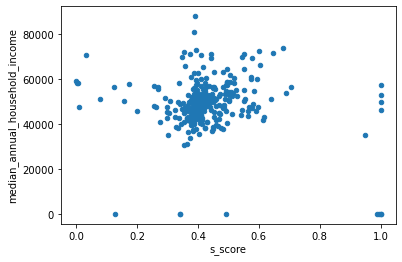

In [99]:
ax = plt.gca()

NeighbourhoodCompareDF.plot(kind='scatter',x='s_score',y='median_annual_household_income',ax=ax)
# NeighbourhoodCompareDF.plot(kind='line',x='name',y='num_pets', color='red', ax=ax)

plt.show()

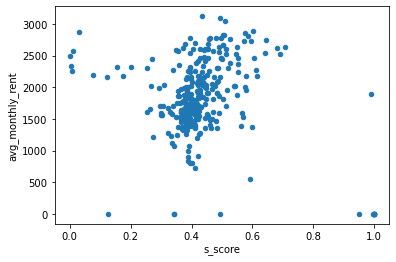

In [100]:
ax = plt.gca()

NeighbourhoodCompareDF.plot(kind='scatter',x='s_score',y='avg_monthly_rent',ax=ax)
# NeighbourhoodCompareDF.plot(kind='line',x='name',y='num_pets', color='red', ax=ax)

plt.show()